In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['solar_activity'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 1975)
(11, 1975)


In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit a CNN-LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# Optimize and fit the model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S12_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

[I 2025-05-27 02:20:25,275] A new study created in memory with name: no-name-95002bf5-247f-488f-9829-813ae1299219
[I 2025-05-27 02:29:24,975] Trial 0 finished with value: 0.5356800258159637 and parameters: {'lr': 0.00781731702759537, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.2668382348926635}. Best is trial 0 with value: 0.5356800258159637.


Cross Validation Accuracies:
[0.527166485786438, 0.5779501795768738, 0.5426211357116699, 0.48509499430656433, 0.5455673336982727]
Mean Cross Validation Accuracy:
0.5356800258159637
Standard Deviation of Cross Validation Accuracy:
0.030212677932801933


[I 2025-05-27 02:33:28,524] Trial 1 finished with value: 0.06245832145214081 and parameters: {'lr': 0.29389395752954, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.14127412824202956}. Best is trial 1 with value: 0.06245832145214081.


Cross Validation Accuracies:
[0.0408274345099926, 0.057829927653074265, 0.08554255217313766, 0.0649542510509491, 0.06313744187355042]
Mean Cross Validation Accuracy:
0.06245832145214081
Standard Deviation of Cross Validation Accuracy:
0.014344963409869217


[I 2025-05-27 02:38:47,412] Trial 2 finished with value: 0.052778729051351544 and parameters: {'lr': 0.028075655689227496, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2914643568779509}. Best is trial 2 with value: 0.052778729051351544.


Cross Validation Accuracies:
[0.041229281574487686, 0.05125323310494423, 0.06207245960831642, 0.06212906539440155, 0.04720960557460785]
Mean Cross Validation Accuracy:
0.052778729051351544
Standard Deviation of Cross Validation Accuracy:
0.008252687181714624


[I 2025-05-27 02:44:17,377] Trial 3 finished with value: 0.05562201738357544 and parameters: {'lr': 0.37934935411734055, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.41480773975973106}. Best is trial 2 with value: 0.052778729051351544.


Cross Validation Accuracies:
[0.04850832000374794, 0.05209112539887428, 0.06297318637371063, 0.057946812361478806, 0.056590642780065536]
Mean Cross Validation Accuracy:
0.05562201738357544
Standard Deviation of Cross Validation Accuracy:
0.004968993479346236


[I 2025-05-27 02:49:02,058] Trial 4 finished with value: 0.05882493406534195 and parameters: {'lr': 0.21599184966451024, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4625231151716357}. Best is trial 2 with value: 0.052778729051351544.


Cross Validation Accuracies:
[0.06038501486182213, 0.05494594946503639, 0.06758005172014236, 0.05928415432572365, 0.051929499953985214]
Mean Cross Validation Accuracy:
0.05882493406534195
Standard Deviation of Cross Validation Accuracy:
0.005327107162465552


[I 2025-05-27 02:53:40,972] Trial 5 finished with value: 0.061220473051071166 and parameters: {'lr': 0.0016445053298762675, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.25395211019224556}. Best is trial 2 with value: 0.052778729051351544.


Cross Validation Accuracies:
[0.04445881396532059, 0.08033160120248795, 0.06629849970340729, 0.06187643110752106, 0.05313701927661896]
Mean Cross Validation Accuracy:
0.061220473051071166
Standard Deviation of Cross Validation Accuracy:
0.012146993826491911


[I 2025-05-27 02:58:49,804] Trial 6 finished with value: 0.13724006712436676 and parameters: {'lr': 0.062115818744038265, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.49224388079654635}. Best is trial 2 with value: 0.052778729051351544.


Cross Validation Accuracies:
[0.13486775755882263, 0.1495317965745926, 0.13872966170310974, 0.1158546656370163, 0.14721645414829254]
Mean Cross Validation Accuracy:
0.13724006712436676
Standard Deviation of Cross Validation Accuracy:
0.011964924173497028


[I 2025-05-27 03:04:04,635] Trial 7 finished with value: 0.059632574766874315 and parameters: {'lr': 0.0022479928882046443, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3109306936244286}. Best is trial 2 with value: 0.052778729051351544.


Cross Validation Accuracies:
[0.04645618051290512, 0.062126923352479935, 0.06842794269323349, 0.06462759524583817, 0.056524232029914856]
Mean Cross Validation Accuracy:
0.059632574766874315
Standard Deviation of Cross Validation Accuracy:
0.007639498170930467


[I 2025-05-27 03:11:14,894] Trial 8 finished with value: 0.06563410684466361 and parameters: {'lr': 0.5710658210005172, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.23371461228017096}. Best is trial 2 with value: 0.052778729051351544.


Cross Validation Accuracies:
[0.05538218095898628, 0.06180812418460846, 0.06583788245916367, 0.0701451227068901, 0.07499722391366959]
Mean Cross Validation Accuracy:
0.06563410684466361
Standard Deviation of Cross Validation Accuracy:
0.006749798182741445


[I 2025-05-27 03:15:29,446] Trial 9 finished with value: 2.9282262086868287 and parameters: {'lr': 0.09691483100910714, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.11142052414863293}. Best is trial 2 with value: 0.052778729051351544.


Cross Validation Accuracies:
[4.0814690589904785, 2.069003105163574, 1.9731532335281372, 2.5059547424316406, 4.0115509033203125]
Mean Cross Validation Accuracy:
2.9282262086868287
Standard Deviation of Cross Validation Accuracy:
0.9308386956394895


[I 2025-05-27 03:20:51,024] Trial 10 finished with value: 0.05267101749777794 and parameters: {'lr': 0.015254886383190629, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.35912547294448466}. Best is trial 10 with value: 0.05267101749777794.


Cross Validation Accuracies:
[0.04094356298446655, 0.049374934285879135, 0.06236618757247925, 0.06260105967521667, 0.048069342970848083]
Mean Cross Validation Accuracy:
0.05267101749777794
Standard Deviation of Cross Validation Accuracy:
0.008510873313314442


[I 2025-05-27 03:26:10,337] Trial 11 finished with value: 0.05272545516490936 and parameters: {'lr': 0.017056801163088, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3693685818426277}. Best is trial 10 with value: 0.05267101749777794.


Cross Validation Accuracies:
[0.038182374089956284, 0.04976474866271019, 0.06278661638498306, 0.06372365355491638, 0.049169883131980896]
Mean Cross Validation Accuracy:
0.05272545516490936
Standard Deviation of Cross Validation Accuracy:
0.009540402670206682


[I 2025-05-27 03:30:36,831] Trial 12 finished with value: 0.05324393883347511 and parameters: {'lr': 0.012218032241811932, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3755151360223696}. Best is trial 10 with value: 0.05267101749777794.


Cross Validation Accuracies:
[0.040777646005153656, 0.05055597797036171, 0.06268805265426636, 0.06400710344314575, 0.04819091409444809]
Mean Cross Validation Accuracy:
0.05324393883347511
Standard Deviation of Cross Validation Accuracy:
0.008867960845326666


[I 2025-05-27 03:37:00,493] Trial 13 finished with value: 0.05376153364777565 and parameters: {'lr': 0.007432362058869235, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.36228713049681466}. Best is trial 10 with value: 0.05267101749777794.


Cross Validation Accuracies:
[0.0400872640311718, 0.05236037075519562, 0.06257090717554092, 0.06667950749397278, 0.04710961878299713]
Mean Cross Validation Accuracy:
0.05376153364777565
Standard Deviation of Cross Validation Accuracy:
0.009774210849067095


[I 2025-05-27 03:41:56,666] Trial 14 finished with value: 0.053024953603744505 and parameters: {'lr': 0.02212669770640089, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3493378149822108}. Best is trial 10 with value: 0.05267101749777794.


Cross Validation Accuracies:
[0.03777142986655235, 0.04948529228568077, 0.06422257423400879, 0.06498342752456665, 0.04866204410791397]
Mean Cross Validation Accuracy:
0.053024953603744505
Standard Deviation of Cross Validation Accuracy:
0.0103211043421796


[I 2025-05-27 03:47:42,311] Trial 15 finished with value: 0.06289966478943824 and parameters: {'lr': 0.0036444517183974014, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.41829341582414914}. Best is trial 10 with value: 0.05267101749777794.


Cross Validation Accuracies:
[0.0801694393157959, 0.052622076123952866, 0.06315477937459946, 0.059057608246803284, 0.059494420886039734]
Mean Cross Validation Accuracy:
0.06289966478943824
Standard Deviation of Cross Validation Accuracy:
0.009276810970782406


[I 2025-05-27 03:54:07,581] Trial 16 finished with value: 0.05079183429479599 and parameters: {'lr': 0.10087911458291908, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.21058213712965732}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.03821505233645439, 0.04906592518091202, 0.06004180759191513, 0.059571459889411926, 0.047064926475286484]
Mean Cross Validation Accuracy:
0.05079183429479599
Standard Deviation of Cross Validation Accuracy:
0.008218124849030074


[I 2025-05-27 03:58:55,979] Trial 17 finished with value: 0.05357126146554947 and parameters: {'lr': 0.06905471443961247, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.16961824684162574}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.04404909536242485, 0.04512990638613701, 0.06147060543298721, 0.06558969616889954, 0.05161700397729874]
Mean Cross Validation Accuracy:
0.05357126146554947
Standard Deviation of Cross Validation Accuracy:
0.008632376880525854


[I 2025-05-27 04:03:59,005] Trial 18 finished with value: 0.38270320296287536 and parameters: {'lr': 0.14019298752106793, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.20535376970608624}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.4173124134540558, 0.4242574870586395, 0.45813262462615967, 0.2943841814994812, 0.31942930817604065]
Mean Cross Validation Accuracy:
0.38270320296287536
Standard Deviation of Cross Validation Accuracy:
0.06390303426870865


[I 2025-05-27 04:09:46,188] Trial 19 finished with value: 3.5009652614593505 and parameters: {'lr': 0.04310137432036503, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.19842168899444773}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[4.16657829284668, 3.7121171951293945, 2.458221197128296, 3.490506887435913, 3.6774027347564697]
Mean Cross Validation Accuracy:
3.5009652614593505
Standard Deviation of Cross Validation Accuracy:
0.5667769561147596


[I 2025-05-27 04:15:05,102] Trial 20 finished with value: 0.06610633060336113 and parameters: {'lr': 0.004582471606818564, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3198048937162742}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.06323374062776566, 0.0849604532122612, 0.06251518428325653, 0.06510843336582184, 0.054713841527700424]
Mean Cross Validation Accuracy:
0.06610633060336113
Standard Deviation of Cross Validation Accuracy:
0.010073833933984283


[I 2025-05-27 04:19:58,515] Trial 21 finished with value: 0.053749185800552365 and parameters: {'lr': 0.018069105698522936, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.40298107073107237}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.04150192439556122, 0.051305655390024185, 0.06303025782108307, 0.06404515355825424, 0.04886293783783913]
Mean Cross Validation Accuracy:
0.053749185800552365
Standard Deviation of Cross Validation Accuracy:
0.008625391838756028


[I 2025-05-27 04:24:18,185] Trial 22 finished with value: 0.07053426206111908 and parameters: {'lr': 0.8869001224641357, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.34442199048955224}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.05595805495977402, 0.05750252306461334, 0.07713019102811813, 0.09233475476503372, 0.06974578648805618]
Mean Cross Validation Accuracy:
0.07053426206111908
Standard Deviation of Cross Validation Accuracy:
0.013428935099514035


[I 2025-05-27 04:28:50,899] Trial 23 finished with value: 0.05266801789402962 and parameters: {'lr': 0.04218828419611347, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2837968521077494}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.04201502352952957, 0.05037786811590195, 0.062061432749032974, 0.06051279604434967, 0.04837296903133392]
Mean Cross Validation Accuracy:
0.05266801789402962
Standard Deviation of Cross Validation Accuracy:
0.007575688833831656


[I 2025-05-27 04:33:48,170] Trial 24 finished with value: 0.054229515790939334 and parameters: {'lr': 0.03479828558779303, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.278299281160952}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.040846649557352066, 0.0517159141600132, 0.0632372573018074, 0.0643589049577713, 0.050988852977752686]
Mean Cross Validation Accuracy:
0.054229515790939334
Standard Deviation of Cross Validation Accuracy:
0.008713955809775537


[I 2025-05-27 04:38:03,385] Trial 25 finished with value: 0.052389712631702424 and parameters: {'lr': 0.14649219408302486, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.24623319432573876}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.036180656403303146, 0.050860997289419174, 0.06270051002502441, 0.06051509082317352, 0.05169130861759186]
Mean Cross Validation Accuracy:
0.052389712631702424
Standard Deviation of Cross Validation Accuracy:
0.009358339128506052


[I 2025-05-27 04:43:30,182] Trial 26 finished with value: 0.05857947692275047 and parameters: {'lr': 0.13656433070728943, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.23251113500231077}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.05602344498038292, 0.05147676542401314, 0.06378848850727081, 0.06795335561037064, 0.05365533009171486]
Mean Cross Validation Accuracy:
0.05857947692275047
Standard Deviation of Cross Validation Accuracy:
0.00626470167328315


[I 2025-05-27 04:49:09,364] Trial 27 finished with value: 0.05800031796097756 and parameters: {'lr': 0.19705364836598274, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.18925211355848695}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.05924772843718529, 0.061086978763341904, 0.06612034142017365, 0.05683479458093643, 0.046711746603250504]
Mean Cross Validation Accuracy:
0.05800031796097756
Standard Deviation of Cross Validation Accuracy:
0.006415739658540053


[I 2025-05-27 04:54:11,483] Trial 28 finished with value: 4.924725532531738 and parameters: {'lr': 0.05182368882343313, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.23300537917448286}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[5.056407928466797, 5.214710235595703, 5.1865339279174805, 4.461773872375488, 4.704201698303223]
Mean Cross Validation Accuracy:
4.924725532531738
Standard Deviation of Cross Validation Accuracy:
0.29425499771763414


[I 2025-05-27 05:00:29,904] Trial 29 finished with value: 0.2466406226158142 and parameters: {'lr': 0.08895722636362435, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.16476214614716064}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.3774110674858093, 0.18445883691310883, 0.2926870584487915, 0.18162481486797333, 0.19702133536338806]
Mean Cross Validation Accuracy:
0.2466406226158142
Standard Deviation of Cross Validation Accuracy:
0.07717109161096154


[I 2025-05-27 05:05:14,698] Trial 30 finished with value: 12.17984504699707 and parameters: {'lr': 0.12827407119590986, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2619066218336413}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[9.371572494506836, 13.495116233825684, 9.716096878051758, 12.916784286499023, 15.39965534210205]
Mean Cross Validation Accuracy:
12.17984504699707
Standard Deviation of Cross Validation Accuracy:
2.3063670932067466


[I 2025-05-27 05:09:49,260] Trial 31 finished with value: 0.05322259590029717 and parameters: {'lr': 0.011739323498737641, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.32245159510487986}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.038628123700618744, 0.05306258425116539, 0.06322026252746582, 0.06271322816610336, 0.04848878085613251]
Mean Cross Validation Accuracy:
0.05322259590029717
Standard Deviation of Cross Validation Accuracy:
0.009224518048984102


[I 2025-05-27 05:14:23,067] Trial 32 finished with value: 0.053325287997722626 and parameters: {'lr': 0.038550806036976436, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.29229885032292474}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.04129548743367195, 0.050763893872499466, 0.06343880295753479, 0.06341537833213806, 0.04771287739276886]
Mean Cross Validation Accuracy:
0.053325287997722626
Standard Deviation of Cross Validation Accuracy:
0.008796238992582766


[I 2025-05-27 05:18:41,051] Trial 33 finished with value: 0.05625345930457115 and parameters: {'lr': 0.37452248762457013, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.26368788882340943}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.041114650666713715, 0.0634814128279686, 0.06177282705903053, 0.06444398313760757, 0.05045442283153534]
Mean Cross Validation Accuracy:
0.05625345930457115
Standard Deviation of Cross Validation Accuracy:
0.009084093396637485


[I 2025-05-27 05:23:02,995] Trial 34 finished with value: 0.053729301691055296 and parameters: {'lr': 0.22098806044478178, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2142000141219323}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.034382883459329605, 0.05232858285307884, 0.06791245192289352, 0.0675411969423294, 0.04648139327764511]
Mean Cross Validation Accuracy:
0.053729301691055296
Standard Deviation of Cross Validation Accuracy:
0.0128117780886195


[I 2025-05-27 05:28:18,113] Trial 35 finished with value: 0.05371498540043831 and parameters: {'lr': 0.007768548746710099, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.13495852885867649}. Best is trial 16 with value: 0.05079183429479599.


Cross Validation Accuracies:
[0.041283439844846725, 0.05190706625580788, 0.06314612925052643, 0.06317901611328125, 0.04905927553772926]
Mean Cross Validation Accuracy:
0.05371498540043831
Standard Deviation of Cross Validation Accuracy:
0.008461700568026332


[I 2025-05-27 05:32:47,980] Trial 36 finished with value: 0.05042213872075081 and parameters: {'lr': 0.09411444884144336, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3945880337981632}. Best is trial 36 with value: 0.05042213872075081.


Cross Validation Accuracies:
[0.03545648604631424, 0.0503561832010746, 0.06166224181652069, 0.05724726617336273, 0.04738851636648178]
Mean Cross Validation Accuracy:
0.05042213872075081
Standard Deviation of Cross Validation Accuracy:
0.00901221678654813


[I 2025-05-27 05:37:57,682] Trial 37 finished with value: 0.052537379413843156 and parameters: {'lr': 0.027727359335974533, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.28528914854195914}. Best is trial 36 with value: 0.05042213872075081.


Cross Validation Accuracies:
[0.04015420749783516, 0.05032514035701752, 0.062320005148649216, 0.059128668159246445, 0.05075887590646744]
Mean Cross Validation Accuracy:
0.052537379413843156
Standard Deviation of Cross Validation Accuracy:
0.007752997828766257


[I 2025-05-27 05:41:40,985] Trial 38 finished with value: 0.05170751363039017 and parameters: {'lr': 0.02668988300296105, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4533942351692283}. Best is trial 36 with value: 0.05042213872075081.


Cross Validation Accuracies:
[0.04008723050355911, 0.05176404491066933, 0.060565367341041565, 0.05745470151305199, 0.048666223883628845]
Mean Cross Validation Accuracy:
0.05170751363039017
Standard Deviation of Cross Validation Accuracy:
0.0071522773991930105


[I 2025-05-27 05:45:17,463] Trial 39 finished with value: 0.7127070307731629 and parameters: {'lr': 0.0827118046200045, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4580759335380141}. Best is trial 36 with value: 0.05042213872075081.


Cross Validation Accuracies:
[1.064133882522583, 0.450724333524704, 0.48955634236335754, 1.0309988260269165, 0.5281217694282532]
Mean Cross Validation Accuracy:
0.7127070307731629
Standard Deviation of Cross Validation Accuracy:
0.27470470733406904


[I 2025-05-27 05:49:04,038] Trial 40 finished with value: 0.07208428531885147 and parameters: {'lr': 0.24944884038064158, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4501383922438258}. Best is trial 36 with value: 0.05042213872075081.


Cross Validation Accuracies:
[0.06498879194259644, 0.07364906370639801, 0.0749051496386528, 0.07189027965068817, 0.07498814165592194]
Mean Cross Validation Accuracy:
0.07208428531885147
Standard Deviation of Cross Validation Accuracy:
0.003720802413215833


[I 2025-05-27 05:53:13,791] Trial 41 finished with value: 0.052730920165777205 and parameters: {'lr': 0.02696385064451478, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4923713681718409}. Best is trial 36 with value: 0.05042213872075081.


Cross Validation Accuracies:
[0.042801033705472946, 0.05248536914587021, 0.0614800900220871, 0.05937986448407173, 0.04750824347138405]
Mean Cross Validation Accuracy:
0.052730920165777205
Standard Deviation of Cross Validation Accuracy:
0.007024182884783274


[I 2025-05-27 05:57:25,939] Trial 42 finished with value: 0.05045221671462059 and parameters: {'lr': 0.06086863168817561, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.42885442211011016}. Best is trial 36 with value: 0.05042213872075081.


Cross Validation Accuracies:
[0.039945825934410095, 0.048772212117910385, 0.060537684708833694, 0.058394767343997955, 0.04461059346795082]
Mean Cross Validation Accuracy:
0.05045221671462059
Standard Deviation of Cross Validation Accuracy:
0.007901037906376755


[I 2025-05-27 06:01:47,611] Trial 43 finished with value: 0.05110701322555542 and parameters: {'lr': 0.058024229913583907, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.43334629848558864}. Best is trial 36 with value: 0.05042213872075081.


Cross Validation Accuracies:
[0.04652221128344536, 0.05406498536467552, 0.061481773853302, 0.0514041930437088, 0.042061902582645416]
Mean Cross Validation Accuracy:
0.05110701322555542
Standard Deviation of Cross Validation Accuracy:
0.006622809199939692


[I 2025-05-27 06:06:16,391] Trial 44 finished with value: 0.05056341513991356 and parameters: {'lr': 0.0590467673321571, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4337960350624276}. Best is trial 36 with value: 0.05042213872075081.


Cross Validation Accuracies:
[0.04293230175971985, 0.053217366337776184, 0.05777104198932648, 0.0529545396566391, 0.045941825956106186]
Mean Cross Validation Accuracy:
0.05056341513991356
Standard Deviation of Cross Validation Accuracy:
0.005372221071786923


[I 2025-05-27 06:10:30,397] Trial 45 finished with value: 0.049146540462970734 and parameters: {'lr': 0.05456110639650731, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.42851947066456514}. Best is trial 45 with value: 0.049146540462970734.


Cross Validation Accuracies:
[0.03310640528798103, 0.04872673377394676, 0.059773728251457214, 0.06104682385921478, 0.043079011142253876]
Mean Cross Validation Accuracy:
0.049146540462970734
Standard Deviation of Cross Validation Accuracy:
0.010476936110796208


[I 2025-05-27 06:14:44,816] Trial 46 finished with value: 0.06140718087553978 and parameters: {'lr': 0.10110236732903427, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3995907964966712}. Best is trial 45 with value: 0.049146540462970734.


Cross Validation Accuracies:
[0.05712997913360596, 0.05206238105893135, 0.06296263635158539, 0.06294506043195724, 0.07193584740161896]
Mean Cross Validation Accuracy:
0.06140718087553978
Standard Deviation of Cross Validation Accuracy:
0.006652173666390165


[I 2025-05-27 06:18:37,891] Trial 47 finished with value: 0.5332837879657746 and parameters: {'lr': 0.0680665234944994, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4825016706901234}. Best is trial 45 with value: 0.049146540462970734.


Cross Validation Accuracies:
[0.6434967517852783, 0.363656222820282, 0.38005682826042175, 0.6825451254844666, 0.5966640114784241]
Mean Cross Validation Accuracy:
0.5332837879657746
Standard Deviation of Cross Validation Accuracy:
0.13468103730072448


[I 2025-05-27 06:23:06,988] Trial 48 finished with value: 0.07479710429906845 and parameters: {'lr': 0.18544977107331523, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3895187112964605}. Best is trial 45 with value: 0.049146540462970734.


Cross Validation Accuracies:
[0.07735224068164825, 0.07601827383041382, 0.0658332109451294, 0.08040552586317062, 0.07437627017498016]
Mean Cross Validation Accuracy:
0.07479710429906845
Standard Deviation of Cross Validation Accuracy:
0.004899037758975643


[I 2025-05-27 06:28:46,338] Trial 49 finished with value: 40.90941543579102 and parameters: {'lr': 0.35778165987034904, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4269466499552241}. Best is trial 45 with value: 0.049146540462970734.


Cross Validation Accuracies:
[42.10306930541992, 40.23337173461914, 39.61585998535156, 38.98747253417969, 43.607303619384766]
Mean Cross Validation Accuracy:
40.90941543579102
Standard Deviation of Cross Validation Accuracy:
1.704558330944694


[I 2025-05-27 06:33:57,306] Trial 50 finished with value: 0.09610834866762161 and parameters: {'lr': 0.10700301018801527, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.44190341857784976}. Best is trial 45 with value: 0.049146540462970734.


Cross Validation Accuracies:
[0.11099126935005188, 0.07645592093467712, 0.10397927463054657, 0.10265623778104782, 0.08645904064178467]
Mean Cross Validation Accuracy:
0.09610834866762161
Standard Deviation of Cross Validation Accuracy:
0.012693736381154048


[I 2025-05-27 06:38:21,740] Trial 51 finished with value: 0.047539166361093524 and parameters: {'lr': 0.05954614185913348, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.42983708497932444}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.032786786556243896, 0.046020690351724625, 0.05832795053720474, 0.05725137144327164, 0.043309032917022705]
Mean Cross Validation Accuracy:
0.047539166361093524
Standard Deviation of Cross Validation Accuracy:
0.009471613376919527


[I 2025-05-27 06:42:55,524] Trial 52 finished with value: 0.0515265129506588 and parameters: {'lr': 0.05051782127866959, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.47888952104383475}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04011484235525131, 0.04978726804256439, 0.059460923075675964, 0.05527998507022858, 0.052989546209573746]
Mean Cross Validation Accuracy:
0.0515265129506588
Standard Deviation of Cross Validation Accuracy:
0.006518206531393034


[I 2025-05-27 06:47:08,610] Trial 53 finished with value: 0.21123443841934203 and parameters: {'lr': 0.0010009737096806713, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.38182900279136134}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.1753811538219452, 0.16677570343017578, 0.1896846890449524, 0.26291224360466003, 0.2614184021949768]
Mean Cross Validation Accuracy:
0.21123443841934203
Standard Deviation of Cross Validation Accuracy:
0.04222666124704571


[I 2025-05-27 06:51:13,154] Trial 54 finished with value: 0.0531367264688015 and parameters: {'lr': 0.07377939879603572, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4085129239988243}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04522540792822838, 0.04929622635245323, 0.06761529296636581, 0.055348340421915054, 0.04819836467504501]
Mean Cross Validation Accuracy:
0.0531367264688015
Standard Deviation of Cross Validation Accuracy:
0.007952935854162527


[I 2025-05-27 06:55:25,463] Trial 55 finished with value: 0.05228469222784042 and parameters: {'lr': 0.05435653488966683, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.41902207885505693}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.03769415616989136, 0.047716785222291946, 0.06068076938390732, 0.06547347456216812, 0.049858275800943375]
Mean Cross Validation Accuracy:
0.05228469222784042
Standard Deviation of Cross Validation Accuracy:
0.009839462430633793


[I 2025-05-27 07:00:45,698] Trial 56 finished with value: 0.057723356783390044 and parameters: {'lr': 0.1012520497189579, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4715934028053692}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.06539463251829147, 0.04641004651784897, 0.07064393162727356, 0.05696331337094307, 0.049204859882593155]
Mean Cross Validation Accuracy:
0.057723356783390044
Standard Deviation of Cross Validation Accuracy:
0.009240380623106068


[I 2025-05-27 07:06:10,941] Trial 57 finished with value: 0.06290129348635673 and parameters: {'lr': 0.16625539822110566, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.43870254872496234}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04989229142665863, 0.0673765167593956, 0.07724364846944809, 0.06636907905340195, 0.05362493172287941]
Mean Cross Validation Accuracy:
0.06290129348635673
Standard Deviation of Cross Validation Accuracy:
0.009930169471863962


[I 2025-05-27 07:13:33,027] Trial 58 finished with value: 0.24489960968494415 and parameters: {'lr': 0.03456933068004538, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.39333521048336173}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.2073083519935608, 0.15294480323791504, 0.3227253258228302, 0.352748841047287, 0.18877072632312775]
Mean Cross Validation Accuracy:
0.24489960968494415
Standard Deviation of Cross Validation Accuracy:
0.07836777326018385


[I 2025-05-27 07:18:44,734] Trial 59 finished with value: 0.05267771258950234 and parameters: {'lr': 0.02188772634655722, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.34047591408479977}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.037146225571632385, 0.05302389711141586, 0.059912338852882385, 0.06251006573438644, 0.050796035677194595]
Mean Cross Validation Accuracy:
0.05267771258950234
Standard Deviation of Cross Validation Accuracy:
0.008875839410988554


[I 2025-05-27 07:25:36,299] Trial 60 finished with value: 7.044624328613281 and parameters: {'lr': 0.07240539612773583, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4193901126162574}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[5.428704261779785, 8.274842262268066, 7.113234996795654, 6.185546398162842, 8.220793724060059]
Mean Cross Validation Accuracy:
7.044624328613281
Standard Deviation of Cross Validation Accuracy:
1.1180993326035125


[I 2025-05-27 07:32:29,180] Trial 61 finished with value: 0.05041614547371864 and parameters: {'lr': 0.060655287179476616, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4345492718832572}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04368233308196068, 0.044540490955114365, 0.05807054042816162, 0.06483221054077148, 0.04095515236258507]
Mean Cross Validation Accuracy:
0.05041614547371864
Standard Deviation of Cross Validation Accuracy:
0.009335851649789732


[I 2025-05-27 07:36:00,883] Trial 62 finished with value: 0.054019886255264285 and parameters: {'lr': 0.045360187544715, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4635565975586811}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.045447248965501785, 0.05234844982624054, 0.05883155018091202, 0.0570848323404789, 0.05638734996318817]
Mean Cross Validation Accuracy:
0.054019886255264285
Standard Deviation of Cross Validation Accuracy:
0.004784029650516038


[I 2025-05-27 07:39:22,200] Trial 63 finished with value: 0.05897346958518028 and parameters: {'lr': 0.11595206187367912, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.37083880088045734}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.05103803798556328, 0.059170518070459366, 0.06925888359546661, 0.059951528906822205, 0.05544837936758995]
Mean Cross Validation Accuracy:
0.05897346958518028
Standard Deviation of Cross Validation Accuracy:
0.006036265488189646


[I 2025-05-27 07:42:31,615] Trial 64 finished with value: 0.055102124065160754 and parameters: {'lr': 0.06332764947587542, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.40816368177439466}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.05149674788117409, 0.05153153836727142, 0.07119245827198029, 0.056242313235998154, 0.045047562569379807]
Mean Cross Validation Accuracy:
0.055102124065160754
Standard Deviation of Cross Validation Accuracy:
0.008798192004712246


[I 2025-05-27 07:45:43,684] Trial 65 finished with value: 0.05733148604631424 and parameters: {'lr': 0.09118809565695167, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4274055722219958}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.03835605829954147, 0.06269945949316025, 0.06702334433794022, 0.07082698494195938, 0.04775158315896988]
Mean Cross Validation Accuracy:
0.05733148604631424
Standard Deviation of Cross Validation Accuracy:
0.012302171710859061


[I 2025-05-27 07:50:39,332] Trial 66 finished with value: 0.10828365981578827 and parameters: {'lr': 0.038163200114761854, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4993659601196893}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.10945305228233337, 0.1017298772931099, 0.11192996054887772, 0.10832179337739944, 0.10998361557722092]
Mean Cross Validation Accuracy:
0.10828365981578827
Standard Deviation of Cross Validation Accuracy:
0.0034786881691481002


[I 2025-05-27 07:53:58,716] Trial 67 finished with value: 0.07110768631100654 and parameters: {'lr': 0.15414528764212768, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4452511404834523}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.07877407222986221, 0.05665185675024986, 0.07534964382648468, 0.06965497136116028, 0.0751078873872757]
Mean Cross Validation Accuracy:
0.07110768631100654
Standard Deviation of Cross Validation Accuracy:
0.007795520178739688


[I 2025-05-27 07:57:03,357] Trial 68 finished with value: 0.05522000044584274 and parameters: {'lr': 0.07758986748597035, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4672352003088063}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.03332198038697243, 0.061917174607515335, 0.05955873429775238, 0.05891233682632446, 0.06238977611064911]
Mean Cross Validation Accuracy:
0.05522000044584274
Standard Deviation of Cross Validation Accuracy:
0.011029406753932387


[I 2025-05-27 08:00:36,315] Trial 69 finished with value: 0.051352201402187346 and parameters: {'lr': 0.05046471452011287, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.10536080166125089}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.03682553023099899, 0.04863030090928078, 0.06134219467639923, 0.061244066804647446, 0.04871891438961029]
Mean Cross Validation Accuracy:
0.051352201402187346
Standard Deviation of Cross Validation Accuracy:
0.009198000705141445


[I 2025-05-27 08:04:39,448] Trial 70 finished with value: 0.06332447603344918 and parameters: {'lr': 0.5346148853944002, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3867773874542504}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.05318152531981468, 0.06339984387159348, 0.07143780589103699, 0.07341450452804565, 0.055188700556755066]
Mean Cross Validation Accuracy:
0.06332447603344918
Standard Deviation of Cross Validation Accuracy:
0.008206226520115285


[I 2025-05-27 08:07:45,805] Trial 71 finished with value: 0.05445392280817032 and parameters: {'lr': 0.060725850150893275, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.43228477516737374}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.042322367429733276, 0.04702650010585785, 0.06796977669000626, 0.0660727322101593, 0.04887823760509491]
Mean Cross Validation Accuracy:
0.05445392280817032
Standard Deviation of Cross Validation Accuracy:
0.01049861464630065


[I 2025-05-27 08:10:51,713] Trial 72 finished with value: 0.05108681842684746 and parameters: {'lr': 0.03168320295718283, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.43175031509405}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.037548236548900604, 0.05521715059876442, 0.0594145767390728, 0.05815991386771202, 0.045094214379787445]
Mean Cross Validation Accuracy:
0.05108681842684746
Standard Deviation of Cross Validation Accuracy:
0.008433793737144639


[I 2025-05-27 08:13:57,646] Trial 73 finished with value: 0.052300379425287244 and parameters: {'lr': 0.021902219136392002, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4124868321791733}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.03718863055109978, 0.051229868084192276, 0.06161194667220116, 0.0639154314994812, 0.04755602031946182]
Mean Cross Validation Accuracy:
0.052300379425287244
Standard Deviation of Cross Validation Accuracy:
0.009732775669591742


[I 2025-05-27 08:16:59,538] Trial 74 finished with value: 0.05338024497032166 and parameters: {'lr': 0.013284873231820114, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4490424551216182}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.03742697462439537, 0.05216669663786888, 0.06305434554815292, 0.06580814719200134, 0.04844506084918976]
Mean Cross Validation Accuracy:
0.05338024497032166
Standard Deviation of Cross Validation Accuracy:
0.010279849728634253


[I 2025-05-27 08:20:31,480] Trial 75 finished with value: 2.945921516418457 and parameters: {'lr': 0.0337420617983062, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.39595235687659897}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[3.689819097518921, 1.5272297859191895, 2.6349174976348877, 3.8568458557128906, 3.0207953453063965]
Mean Cross Validation Accuracy:
2.945921516418457
Standard Deviation of Cross Validation Accuracy:
0.8364427749971901


[I 2025-05-27 08:24:41,787] Trial 76 finished with value: 0.05373592525720596 and parameters: {'lr': 0.04252538623348289, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.3559590719957629}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04321790114045143, 0.05932971462607384, 0.060931552201509476, 0.06068902835249901, 0.04451142996549606]
Mean Cross Validation Accuracy:
0.05373592525720596
Standard Deviation of Cross Validation Accuracy:
0.008088674971662883


[I 2025-05-27 08:28:00,680] Trial 77 finished with value: 0.05345325693488121 and parameters: {'lr': 0.12619196500711888, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.42302744867221775}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04412629455327988, 0.05060386657714844, 0.06281621009111404, 0.05960801988840103, 0.05011189356446266]
Mean Cross Validation Accuracy:
0.05345325693488121
Standard Deviation of Cross Validation Accuracy:
0.006809140337392851


[I 2025-05-27 08:31:32,298] Trial 78 finished with value: 0.0979004055261612 and parameters: {'lr': 0.030867544632687628, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.43931407556159674}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.07760270684957504, 0.0798630341887474, 0.11564605683088303, 0.11093509942293167, 0.10545513033866882]
Mean Cross Validation Accuracy:
0.0979004055261612
Standard Deviation of Cross Validation Accuracy:
0.01599517795170309


[I 2025-05-27 08:34:14,542] Trial 79 finished with value: 0.050451204925775525 and parameters: {'lr': 0.047130910547033895, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4842634948054056}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.03415621444582939, 0.04675443097949028, 0.06106741726398468, 0.06436280906200409, 0.0459151528775692]
Mean Cross Validation Accuracy:
0.050451204925775525
Standard Deviation of Cross Validation Accuracy:
0.011009135430074255


[I 2025-05-27 08:37:13,575] Trial 80 finished with value: 0.05011023357510567 and parameters: {'lr': 0.09075501439468285, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.48624213196009664}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.03541187942028046, 0.0517355352640152, 0.061923060566186905, 0.056950829923152924, 0.04452986270189285]
Mean Cross Validation Accuracy:
0.05011023357510567
Standard Deviation of Cross Validation Accuracy:
0.009339811555287146


[I 2025-05-27 08:40:22,994] Trial 81 finished with value: 0.05230753645300865 and parameters: {'lr': 0.08473891880172749, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4830283339921687}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04293094947934151, 0.05190475285053253, 0.061579182744026184, 0.058095332235097885, 0.04702746495604515]
Mean Cross Validation Accuracy:
0.05230753645300865
Standard Deviation of Cross Validation Accuracy:
0.0068618332518230645


[I 2025-05-27 08:43:17,574] Trial 82 finished with value: 0.053079015016555785 and parameters: {'lr': 0.06082038100847956, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4739003797916073}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04448908939957619, 0.05171352997422218, 0.061383843421936035, 0.05922120809555054, 0.04858740419149399]
Mean Cross Validation Accuracy:
0.053079015016555785
Standard Deviation of Cross Validation Accuracy:
0.006364316930705968


[I 2025-05-27 08:46:21,893] Trial 83 finished with value: 0.053100687265396115 and parameters: {'lr': 0.04810278340433245, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.45807351116603584}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.0402521938085556, 0.05100182443857193, 0.062297020107507706, 0.06258376687765121, 0.04936863109469414]
Mean Cross Validation Accuracy:
0.053100687265396115
Standard Deviation of Cross Validation Accuracy:
0.008460716154237076


[I 2025-05-27 08:49:25,354] Trial 84 finished with value: 0.052475929260253906 and parameters: {'lr': 0.11115896338488519, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4829721667401501}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.03968287259340286, 0.05195790156722069, 0.06606294214725494, 0.05779479444026947, 0.04688113555312157]
Mean Cross Validation Accuracy:
0.052475929260253906
Standard Deviation of Cross Validation Accuracy:
0.009034706571794051


[I 2025-05-27 08:53:17,013] Trial 85 finished with value: 0.05233828797936439 and parameters: {'lr': 0.08685844280009164, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.49994293243841254}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.03881547972559929, 0.05051140859723091, 0.06330517679452896, 0.05840645730495453, 0.050652917474508286]
Mean Cross Validation Accuracy:
0.05233828797936439
Standard Deviation of Cross Validation Accuracy:
0.008320332136781749


[I 2025-05-27 08:56:14,088] Trial 86 finished with value: 0.058002956211566925 and parameters: {'lr': 0.07295042477775596, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1307592877858187}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.036356326192617416, 0.07218333333730698, 0.06337334960699081, 0.07230184972286224, 0.045799922198057175]
Mean Cross Validation Accuracy:
0.058002956211566925
Standard Deviation of Cross Validation Accuracy:
0.014504297339818634


[I 2025-05-27 08:59:07,581] Trial 87 finished with value: 0.055325216799974444 and parameters: {'lr': 0.26687726663539885, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4597631422644217}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04673587158322334, 0.051377758383750916, 0.06455068290233612, 0.06041466072201729, 0.05354711040854454]
Mean Cross Validation Accuracy:
0.055325216799974444
Standard Deviation of Cross Validation Accuracy:
0.006380166232646702


[I 2025-05-27 09:02:16,242] Trial 88 finished with value: 0.05357007086277008 and parameters: {'lr': 0.04123279885325611, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.16168754645082506}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04306550696492195, 0.04951876401901245, 0.06105386093258858, 0.0642404854297638, 0.04997173696756363]
Mean Cross Validation Accuracy:
0.05357007086277008
Standard Deviation of Cross Validation Accuracy:
0.007868568071615938


[I 2025-05-27 09:05:09,121] Trial 89 finished with value: 0.40390302538871764 and parameters: {'lr': 0.05651303658060729, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4031329002577004}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.3999888598918915, 0.3866685628890991, 0.3340219259262085, 0.33009862899780273, 0.5687371492385864]
Mean Cross Validation Accuracy:
0.40390302538871764
Standard Deviation of Cross Validation Accuracy:
0.08696331728177988


[I 2025-05-27 09:08:24,415] Trial 90 finished with value: 0.0788495808839798 and parameters: {'lr': 0.12232394653508114, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.381763566034029}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.0609847754240036, 0.08857043832540512, 0.09005951136350632, 0.0783512219786644, 0.07628195732831955]
Mean Cross Validation Accuracy:
0.0788495808839798
Standard Deviation of Cross Validation Accuracy:
0.010451315105738756


[I 2025-05-27 09:11:17,087] Trial 91 finished with value: 0.05165478065609932 and parameters: {'lr': 0.025538530573629925, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.45092704541980666}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.037830036133527756, 0.05364495515823364, 0.06190669536590576, 0.058612920343875885, 0.04627929627895355]
Mean Cross Validation Accuracy:
0.05165478065609932
Standard Deviation of Cross Validation Accuracy:
0.008689046565464053


[I 2025-05-27 09:14:09,019] Trial 92 finished with value: 0.052159608155488965 and parameters: {'lr': 0.019123957481285113, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4365056918237642}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.040215976536273956, 0.05199853330850601, 0.05916880443692207, 0.06110852584242821, 0.04830620065331459]
Mean Cross Validation Accuracy:
0.052159608155488965
Standard Deviation of Cross Validation Accuracy:
0.007572806494542516


[I 2025-05-27 09:16:56,223] Trial 93 finished with value: 0.0621351107954979 and parameters: {'lr': 0.0969412919580562, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3019086073842768}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.06859105825424194, 0.06304571032524109, 0.0612182579934597, 0.05198806896805763, 0.0658324584364891]
Mean Cross Validation Accuracy:
0.0621351107954979
Standard Deviation of Cross Validation Accuracy:
0.0056565343732784485


[I 2025-05-27 09:19:49,059] Trial 94 finished with value: 0.05064937323331833 and parameters: {'lr': 0.06506642990087173, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4124609939377615}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04852922260761261, 0.04536638781428337, 0.055980805307626724, 0.05598771199584007, 0.04738273844122887]
Mean Cross Validation Accuracy:
0.05064937323331833
Standard Deviation of Cross Validation Accuracy:
0.004472089113260428


[I 2025-05-27 09:22:36,967] Trial 95 finished with value: 0.05335958898067474 and parameters: {'lr': 0.07200217281165316, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.48943878281387426}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04044298827648163, 0.06000751629471779, 0.06156628951430321, 0.06006689369678497, 0.04471425712108612]
Mean Cross Validation Accuracy:
0.05335958898067474
Standard Deviation of Cross Validation Accuracy:
0.008923151287411774


[I 2025-05-27 09:25:37,267] Trial 96 finished with value: 0.049190256744623184 and parameters: {'lr': 0.04799966994480286, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.41452829180623546}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.045195840299129486, 0.04458208754658699, 0.057091787457466125, 0.05607002601027489, 0.04301154240965843]
Mean Cross Validation Accuracy:
0.049190256744623184
Standard Deviation of Cross Validation Accuracy:
0.006084940586159655


[I 2025-05-27 09:29:05,991] Trial 97 finished with value: 0.05141248106956482 and parameters: {'lr': 0.0480566371182507, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4140972813968279}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.04164031893014908, 0.0542367585003376, 0.05835077539086342, 0.057531800121068954, 0.045302752405405045]
Mean Cross Validation Accuracy:
0.05141248106956482
Standard Deviation of Cross Validation Accuracy:
0.006728840523860324


[I 2025-05-27 09:32:15,266] Trial 98 finished with value: 0.05059676021337509 and parameters: {'lr': 0.037551578542645056, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4234467748570554}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.041579216718673706, 0.049117013812065125, 0.05937239155173302, 0.0580047108232975, 0.04491046816110611]
Mean Cross Validation Accuracy:
0.05059676021337509
Standard Deviation of Cross Validation Accuracy:
0.0070388791013987154


[I 2025-05-27 09:35:33,918] Trial 99 finished with value: 0.04784821197390556 and parameters: {'lr': 0.03734961315696197, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.42572782342338794}. Best is trial 51 with value: 0.047539166361093524.


Cross Validation Accuracies:
[0.03281823918223381, 0.04837080091238022, 0.05913649499416351, 0.05515214428305626, 0.043763380497694016]
Mean Cross Validation Accuracy:
0.04784821197390556
Standard Deviation of Cross Validation Accuracy:
0.009204692175495683
Number of finished trials: 100
Best trial: {'lr': 0.05954614185913348, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.42983708497932444}
Best hyperparameters:  {'lr': 0.05954614185913348, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.42983708497932444}
Epoch 1/100
84/84 [==============================] - 13s 70ms/step - loss: 0.1163 - val_loss: 0.0832
Epoch 2/100
84/84 [==============================] - 3s 40ms/step - loss: 0.0827 - val_loss: 0.0547
Epoch 3/100
84/84 [==============================] - 3s 38ms/step - loss: 0.0728 - val_loss: 0.0533
Epoch 4/100
84/84 [==============================] - 3s 38ms/step - loss:

NameError: name 'mean_absolute_error' is not defined

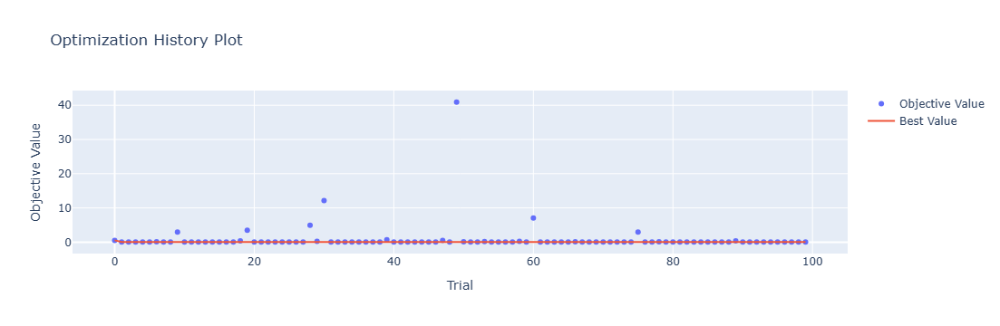

In [4]:
optuna.visualization.plot_optimization_history(study)

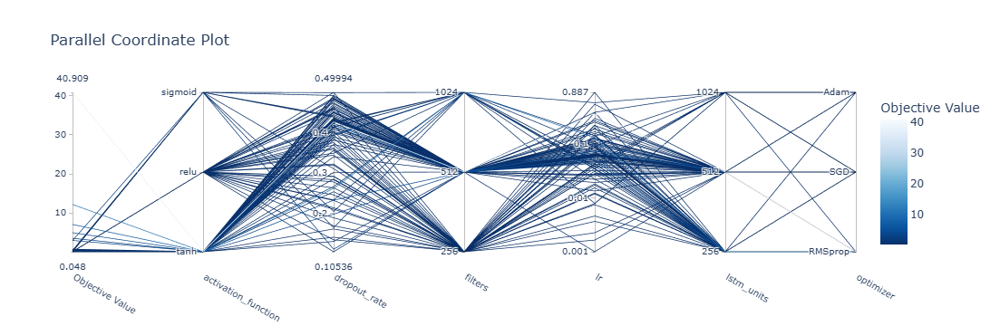

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

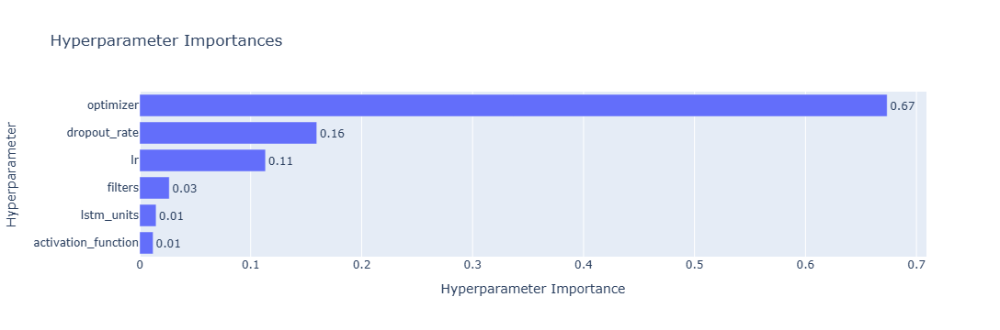

In [6]:
optuna.visualization.plot_param_importances(study)

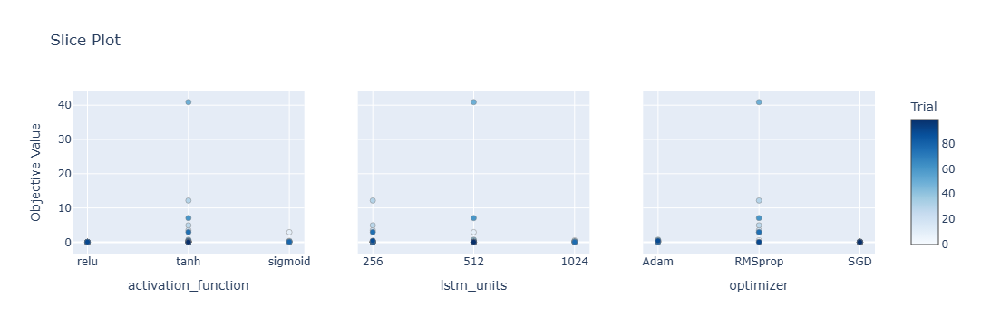

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

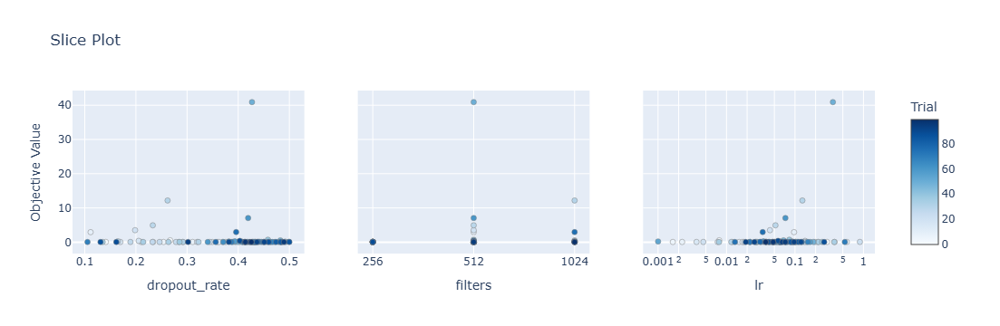

In [9]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate', 'filters'])

Epoch 1/100
84/84 [==============================] - 11s 31ms/step - loss: 0.1181 - accuracy: 0.5714 - mae: 0.1026 - rmse: 0.1181 - mape: 17.3634 - pearson: 0.5501 - val_loss: 0.0822 - val_accuracy: 0.8000 - val_mae: 0.0682 - val_rmse: 0.0822 - val_mape: 11.3275 - val_pearson: 0.7274
Epoch 2/100
84/84 [==============================] - 1s 17ms/step - loss: 0.0810 - accuracy: 0.7024 - mae: 0.0664 - rmse: 0.0810 - mape: 11.2212 - pearson: 0.6160 - val_loss: 0.0746 - val_accuracy: 0.2000 - val_mae: 0.0598 - val_rmse: 0.0746 - val_mape: 10.0253 - val_pearson: 0.5753
Epoch 3/100
84/84 [==============================] - 1s 17ms/step - loss: 0.0761 - accuracy: 0.7024 - mae: 0.0633 - rmse: 0.0761 - mape: 10.7212 - pearson: 0.6258 - val_loss: 0.0617 - val_accuracy: 0.8000 - val_mae: 0.0470 - val_rmse: 0.0617 - val_mape: 7.4958 - val_pearson: 0.8251
Epoch 4/100
84/84 [==============================] - 1s 16ms/step - loss: 0.0703 - accuracy: 0.6905 - mae: 0.0583 - rmse: 0.0703 - mape: 9.9013 - pe

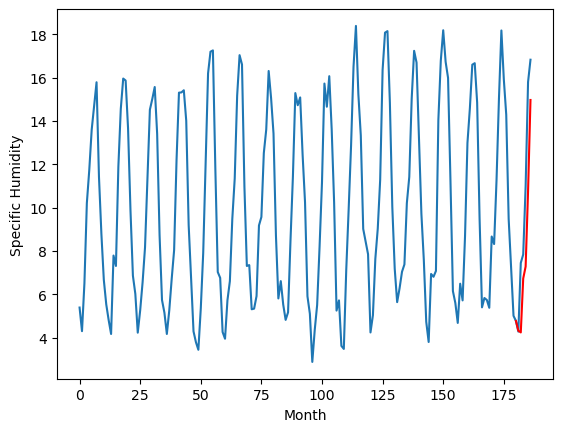

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.01		-0.89
5.61		4.21		-1.40
7.82		6.03		-1.79
8.04		6.54		-1.50
10.53		9.27		-1.26
15.28		13.47		-1.81
[180, 181, 182, 183, 184, 185, 186]
[7.05, 4.0094454169273375, 4.21355200111866, 6.034827950596809, 6.539208057522774, 9.273171070218087, 13.469290378689767]


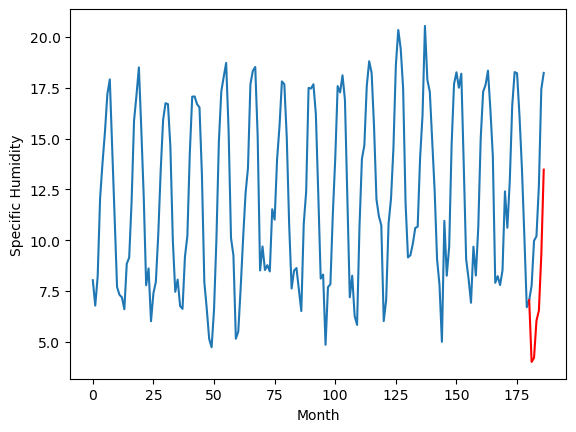

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		3.85		-0.97
4.97		3.96		-1.01
6.82		5.86		-0.96
7.06		6.42		-0.64
9.82		9.16		-0.66
14.44		13.50		-0.94
[180, 181, 182, 183, 184, 185, 186]
[5.06, 3.8456465625762943, 3.959516117870808, 5.857087085545063, 6.423471103012562, 9.16347540408373, 13.496421227753164]


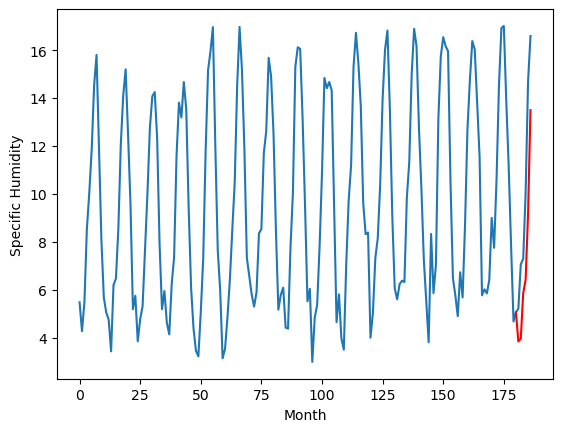

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		3.66		-0.55
4.12		3.70		-0.42
7.57		6.03		-1.54
8.14		6.51		-1.63
11.65		9.88		-1.77
15.55		13.93		-1.62
[180, 181, 182, 183, 184, 185, 186]
[7.05, 3.6589453959465024, 3.7020538555085656, 6.025397132486105, 6.50914985999465, 9.883007119745017, 13.930147718042136]


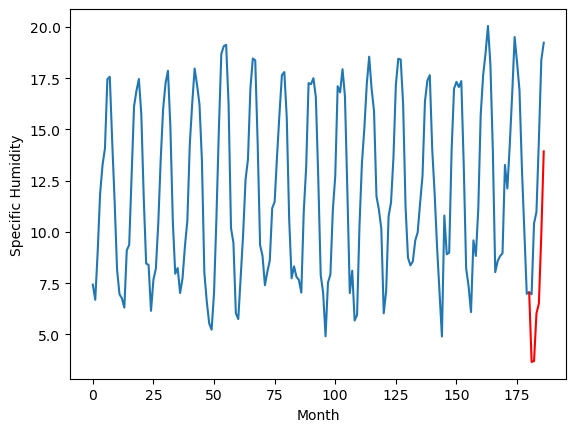

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		4.97		-0.35
4.92		4.84		-0.08
7.76		7.48		-0.28
9.16		7.93		-1.23
13.17		11.74		-1.43
16.86		15.56		-1.30
[180, 181, 182, 183, 184, 185, 186]
[5.2, 4.966976299285888, 4.840414553284645, 7.484146147370338, 7.927870034575462, 11.738924979567528, 15.562828540205956]


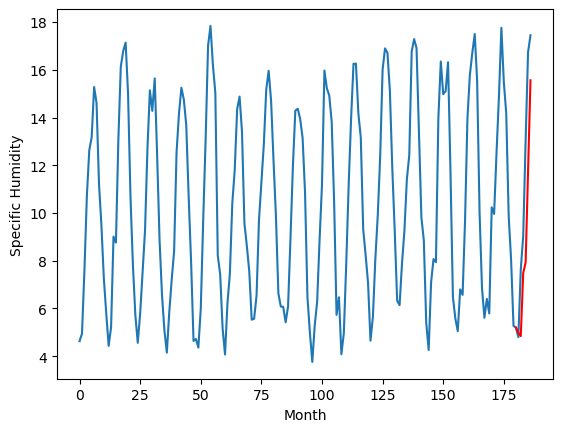

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		7.39		-0.03
8.01		7.54		-0.47
9.58		9.20		-0.38
10.59		9.80		-0.79
13.09		12.20		-0.89
18.35		16.64		-1.71
[180, 181, 182, 183, 184, 185, 186]
[5.16, 7.3864163446426385, 7.544571532607078, 9.200869097113609, 9.795004739165305, 12.198996438384055, 16.638856782317163]


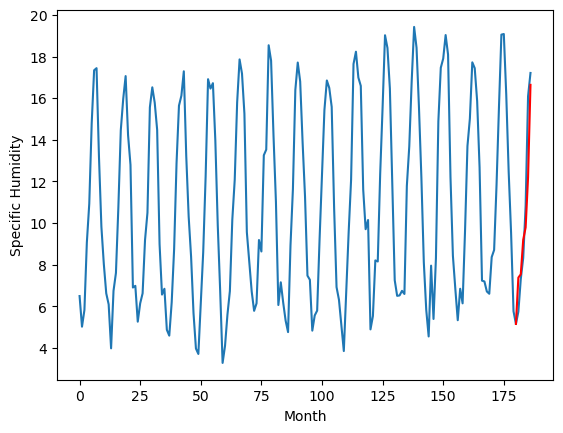

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		4.84		-0.49
5.38		4.96		-0.42
6.97		6.73		-0.24
7.57		7.33		-0.24
10.57		9.87		-0.70
14.95		14.30		-0.65
[180, 181, 182, 183, 184, 185, 186]
[4.05, 4.840547900199891, 4.956014591753483, 6.727761942446232, 7.325021285116673, 9.867124337255955, 14.298969048559666]


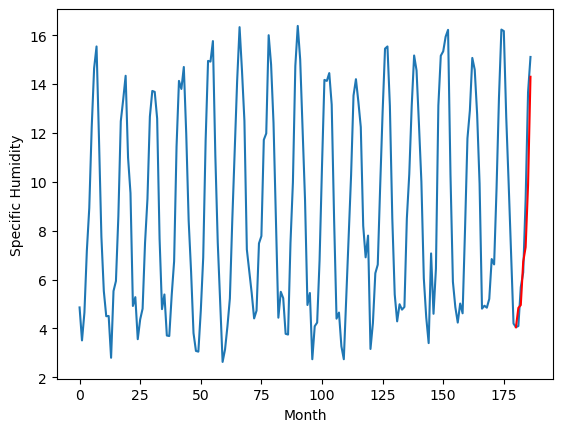

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		6.75		-0.37
7.15		6.85		-0.30
8.77		8.55		-0.22
9.47		9.19		-0.28
12.49		11.60		-0.89
16.76		16.12		-0.64
[180, 181, 182, 183, 184, 185, 186]
[3.64, 6.749896399974823, 6.8511213439702985, 8.552639402747154, 9.188055910468101, 11.595514454245567, 16.118787922263145]


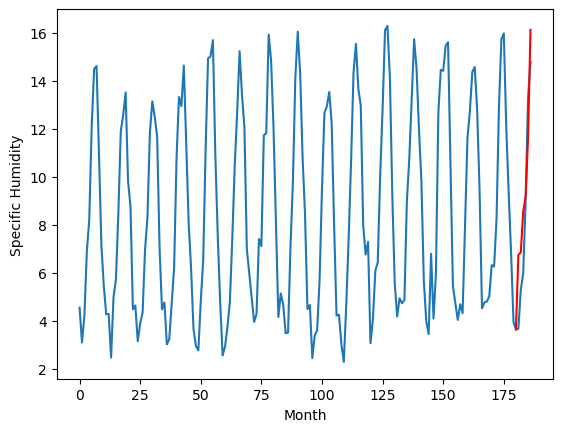

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		3.98		-0.42
3.72		3.84		0.12
6.78		6.16		-0.62
7.51		6.82		-0.69
10.42		9.95		-0.47
15.40		14.44		-0.96
[180, 181, 182, 183, 184, 185, 186]
[3.46, 3.9758507657051085, 3.83672270655632, 6.162547682523727, 6.82350865483284, 9.949483548402785, 14.44409004330635]


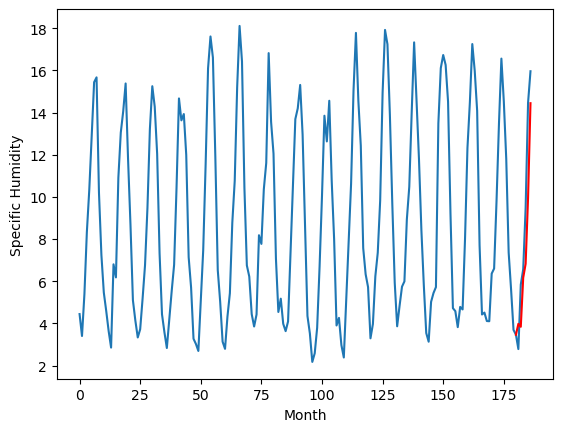

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		5.71		-0.46
5.72		5.61		-0.11
7.52		7.49		-0.03
8.84		8.26		-0.58
10.93		10.69		-0.24
15.70		15.51		-0.19
[180, 181, 182, 183, 184, 185, 186]
[2.93, 5.705503225326538, 5.614395014941692, 7.489102356135845, 8.263013057410717, 10.685545854270458, 15.513809137046337]


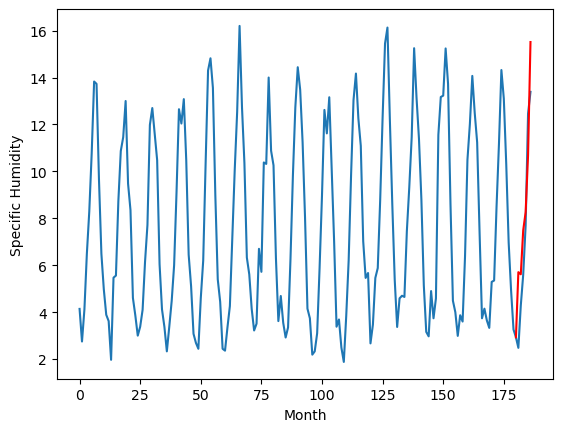

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.04		-0.44
3.74		3.96		0.22
5.36		5.66		0.30
6.96		6.44		-0.52
8.48		8.64		0.16
13.61		13.47		-0.14
[180, 181, 182, 183, 184, 185, 186]
[2.74, 4.040969059467316, 3.958529547452927, 5.656650260686875, 6.438911155462265, 8.639376596212387, 13.473935559988021]


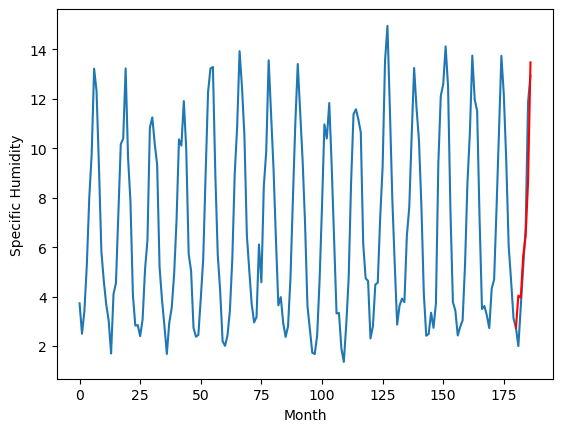

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.321052179336548, 4.0094454169273375, 3.8456465625762943, 3.6589453959465024, 4.966976299285888, 7.3864163446426385, 4.840547900199891, 6.749896399974823, 3.9758507657051085, 5.705503225326538, 4.040969059467316]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.321052
1                 1    4.90   4.009445
2                 2    4.82   3.845647
3                 3    4.21   3.658945
4                 4    5.32   4.966976
5                 5    7.42   7.386416
6                 6    5.33   4.840548
7                 7    7.12   6.749896
8                 8    4.40   3.975851
9                 9    6.17   5.705503
10               10    4.48   4.040969


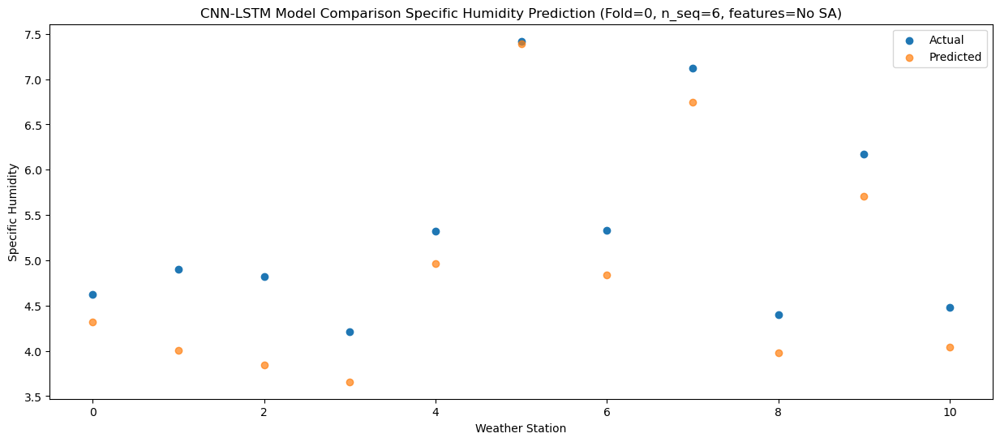

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   4.241941
1                 1    5.61   4.213552
2                 2    4.97   3.959516
3                 3    4.12   3.702054
4                 4    4.92   4.840415
5                 5    8.01   7.544572
6                 6    5.38   4.956015
7                 7    7.15   6.851121
8                 8    3.72   3.836723
9                 9    5.72   5.614395
10               10    3.74   3.958530


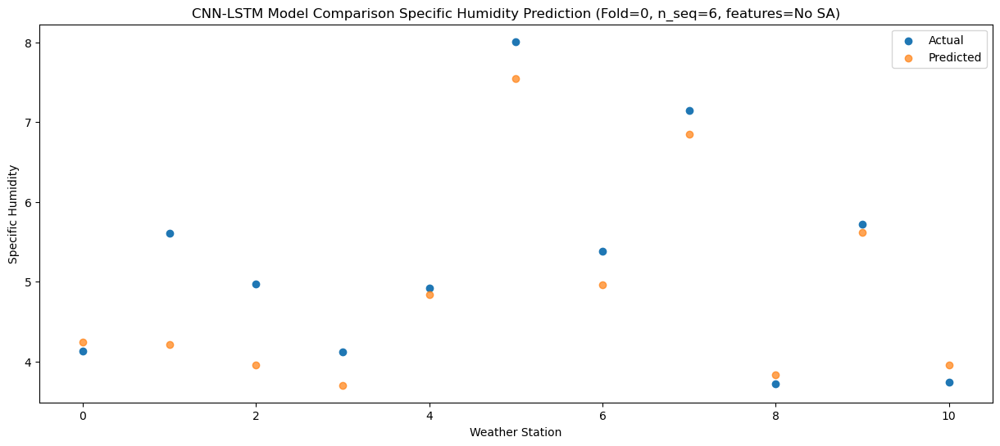

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   6.729818
1                 1    7.82   6.034828
2                 2    6.82   5.857087
3                 3    7.57   6.025397
4                 4    7.76   7.484146
5                 5    9.58   9.200869
6                 6    6.97   6.727762
7                 7    8.77   8.552639
8                 8    6.78   6.162548
9                 9    7.52   7.489102
10               10    5.36   5.656650


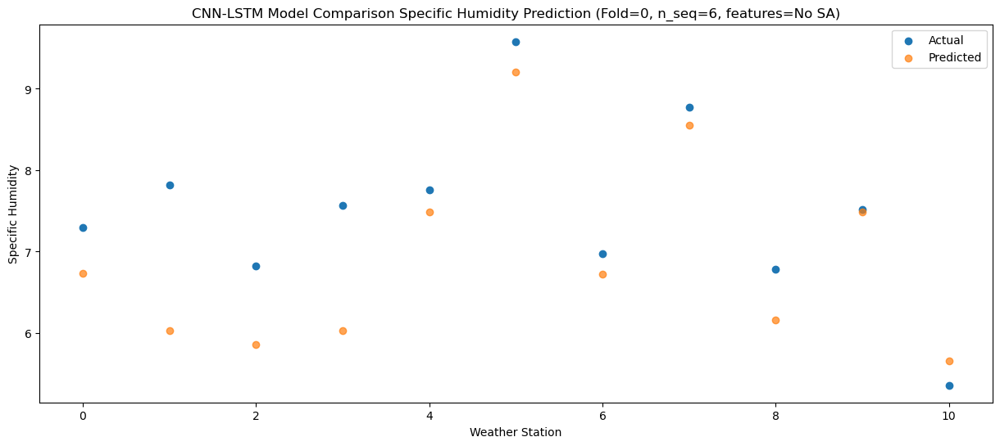

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.69   7.283409
1                 1    8.04   6.539208
2                 2    7.06   6.423471
3                 3    8.14   6.509150
4                 4    9.16   7.927870
5                 5   10.59   9.795005
6                 6    7.57   7.325021
7                 7    9.47   9.188056
8                 8    7.51   6.823509
9                 9    8.84   8.263013
10               10    6.96   6.438911


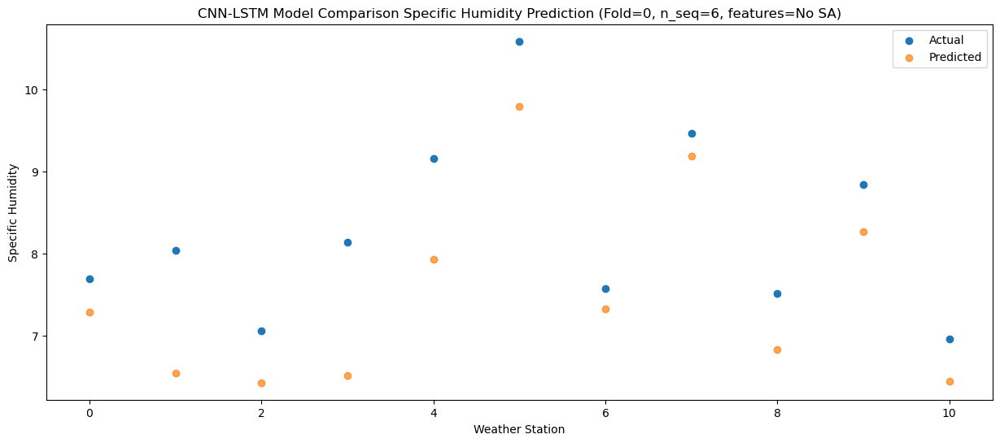

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.84  10.755474
1                 1   10.53   9.273171
2                 2    9.82   9.163475
3                 3   11.65   9.883007
4                 4   13.17  11.738925
5                 5   13.09  12.198996
6                 6   10.57   9.867124
7                 7   12.49  11.595514
8                 8   10.42   9.949484
9                 9   10.93  10.685546
10               10    8.48   8.639377


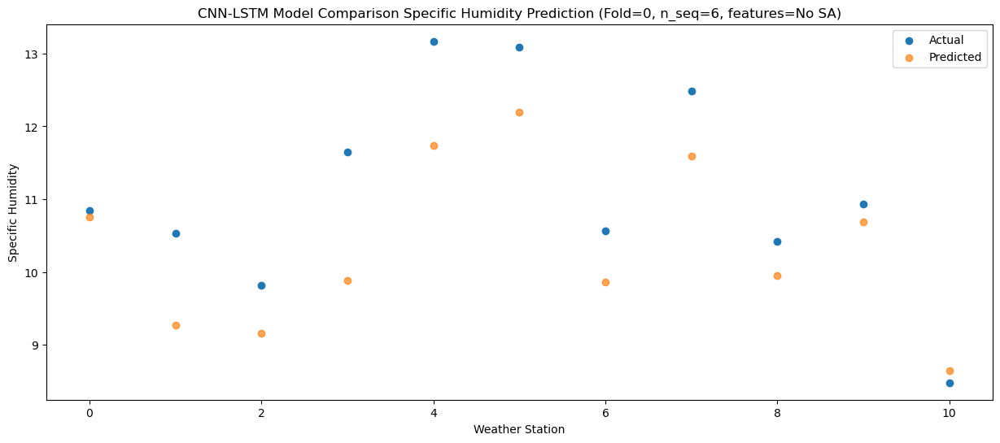

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.65  14.971613
1                 1   15.28  13.469290
2                 2   14.44  13.496421
3                 3   15.55  13.930148
4                 4   16.86  15.562829
5                 5   18.35  16.638857
6                 6   14.95  14.298969
7                 7   16.76  16.118788
8                 8   15.40  14.444090
9                 9   15.70  15.513809
10               10   13.61  13.473936


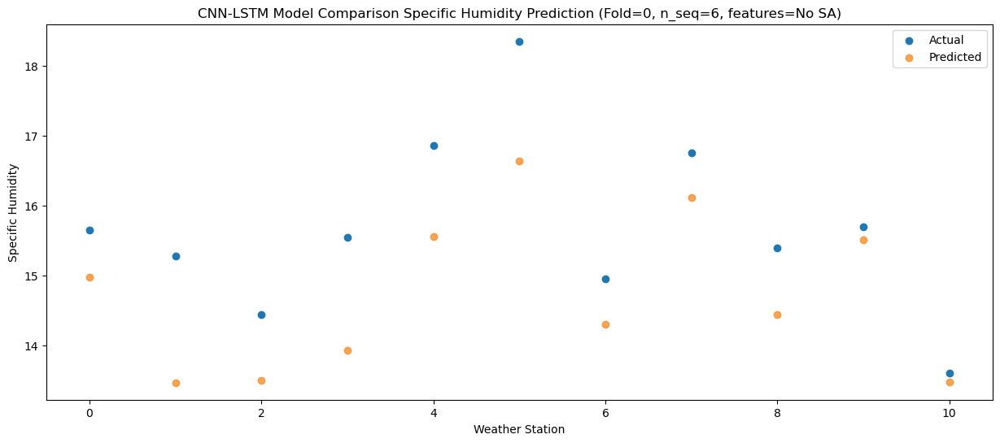

Model: "sequential_1006"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1006 (Conv1D)        (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_1006 (MaxPool  (None, 1, 512)           0         
 ing1D)                                                          
                                                                 
 dropout_3018 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_2012 (LSTM)            (None, 1, 512)            2099200   
                                                                 
 dropout_3019 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_2013 (LSTM)            (None, 512)               2099200   
                                                   

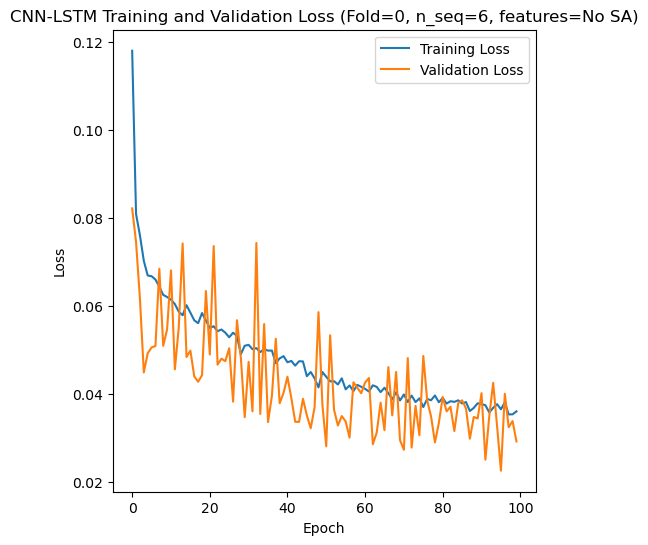

Epoch 1/100
84/84 [==============================] - 12s 88ms/step - loss: 0.1136 - accuracy: 0.6310 - mae: 0.0976 - rmse: 0.1136 - mape: 16.6362 - pearson: 0.5498 - val_loss: 0.0915 - val_accuracy: 0.7000 - val_mae: 0.0784 - val_rmse: 0.0915 - val_mape: 13.7739 - val_pearson: 0.6397
Epoch 2/100
84/84 [==============================] - 3s 39ms/step - loss: 0.0792 - accuracy: 0.7262 - mae: 0.0646 - rmse: 0.0792 - mape: 10.9168 - pearson: 0.6610 - val_loss: 0.0777 - val_accuracy: 0.7000 - val_mae: 0.0661 - val_rmse: 0.0777 - val_mape: 11.7537 - val_pearson: 0.6793
Epoch 3/100
84/84 [==============================] - 3s 39ms/step - loss: 0.0704 - accuracy: 0.7500 - mae: 0.0572 - rmse: 0.0704 - mape: 9.6552 - pearson: 0.7004 - val_loss: 0.0989 - val_accuracy: 0.7000 - val_mae: 0.0829 - val_rmse: 0.0989 - val_mape: 13.2712 - val_pearson: 0.4823
Epoch 4/100
84/84 [==============================] - 3s 39ms/step - loss: 0.0662 - accuracy: 0.7976 - mae: 0.0540 - rmse: 0.0662 - mape: 9.1033 - pe

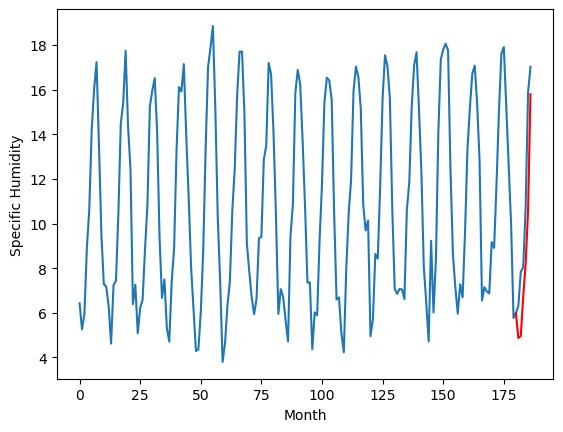

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		4.36		0.02
4.53		4.26		-0.27
6.06		6.28		0.22
6.42		7.79		1.37
9.34		10.39		1.05
13.32		15.66		2.34
[180, 181, 182, 183, 184, 185, 186]
[4.15, 4.357603572010994, 4.257116071581841, 6.282304756045342, 7.787653915286064, 10.385128728747368, 15.661687127947808]


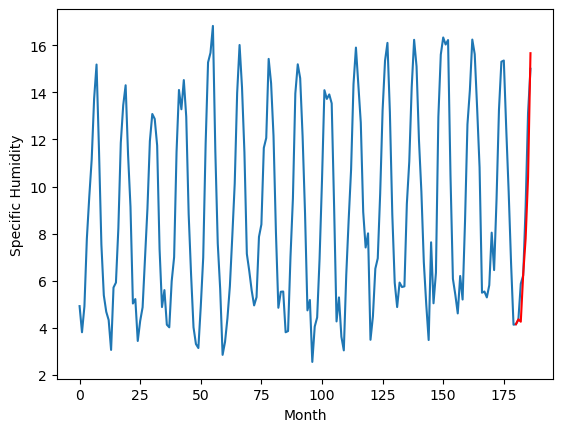

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		3.19		-0.03
3.22		3.06		-0.16
5.84		5.31		-0.53
5.55		6.73		1.18
8.39		9.65		1.26
12.91		14.81		1.90
[180, 181, 182, 183, 184, 185, 186]
[5.12, 3.188411526083946, 3.0622771006822584, 5.314076207280159, 6.733505032658577, 9.652420065999031, 14.8069854003191]


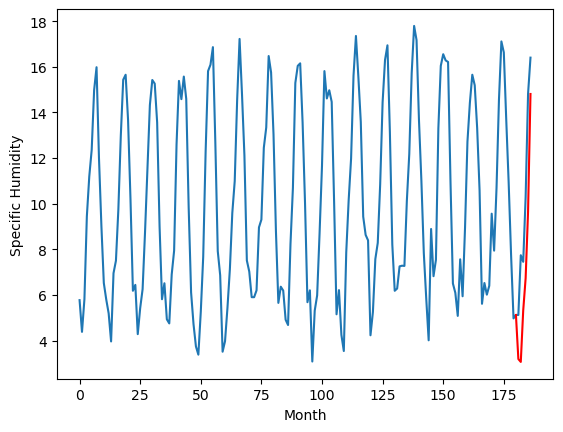

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.71		0.68
2.10		2.33		0.23
4.74		4.91		0.17
6.08		6.16		0.08
9.97		9.59		-0.38
13.16		14.18		1.02
[180, 181, 182, 183, 184, 185, 186]
[6.35, 2.705667997598648, 2.334367926120758, 4.907284433841705, 6.155497128963471, 9.590502793788911, 14.177444036006928]


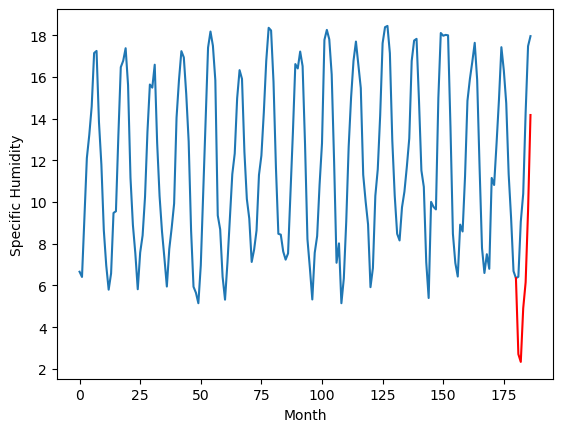

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.77		0.59
6.22		6.36		0.14
8.94		8.99		0.05
10.20		10.24		0.04
14.23		13.74		-0.49
17.64		18.32		0.68
[180, 181, 182, 183, 184, 185, 186]
[6.08, 6.7660450267791745, 6.362280212640762, 8.99242361664772, 10.244586669206619, 13.735440694093704, 18.324216805696487]


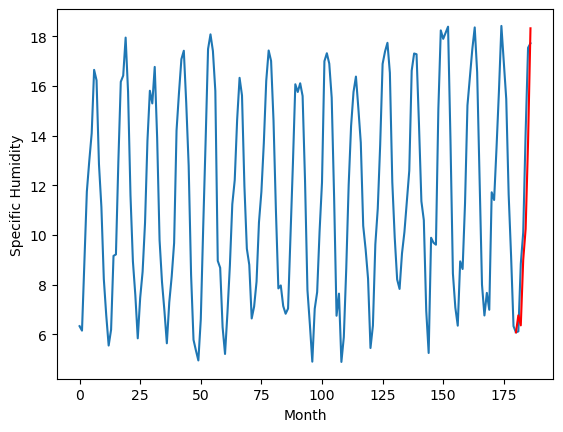

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		5.34		-0.41
5.12		4.96		-0.16
5.91		6.83		0.92
7.21		8.04		0.83
11.52		10.72		-0.80
13.69		14.83		1.14
[180, 181, 182, 183, 184, 185, 186]
[3.92, 5.338324440717697, 4.963339431285858, 6.832623107433319, 8.043755633831024, 10.722807986736298, 14.831569774150848]


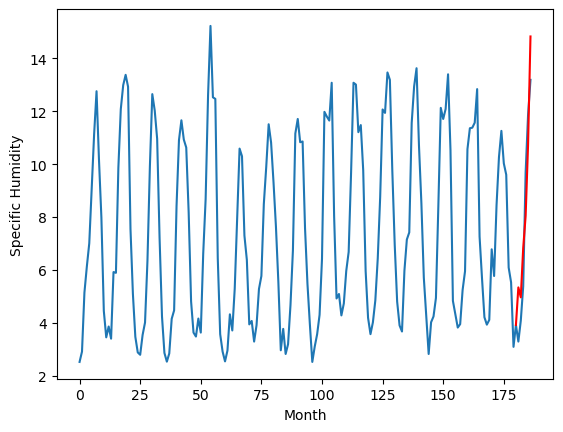

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.79		0.13
5.78		5.72		-0.06
7.34		7.68		0.34
7.96		9.20		1.24
10.89		11.73		0.84
15.24		17.03		1.79
[180, 181, 182, 183, 184, 185, 186]
[4.16, 5.793131731897592, 5.718261197656393, 7.684133723825216, 9.201617077440023, 11.725834444612264, 17.030558184236288]


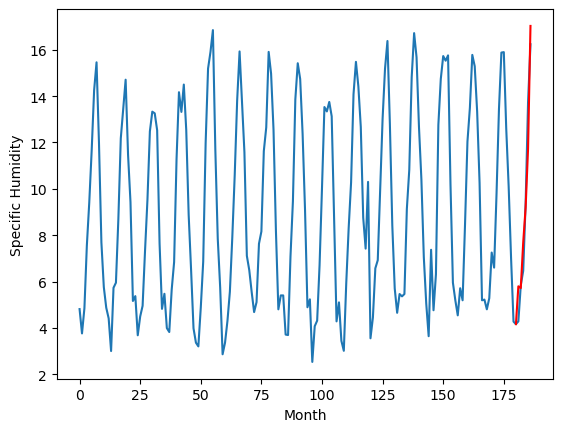

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.84		0.31
6.01		6.39		0.38
8.74		9.05		0.31
9.97		10.46		0.49
13.18		13.81		0.63
17.94		18.80		0.86
[180, 181, 182, 183, 184, 185, 186]
[3.84, 6.841184053421021, 6.393376294374466, 9.047253552675247, 10.462003175020218, 13.81291479229927, 18.800026837587357]


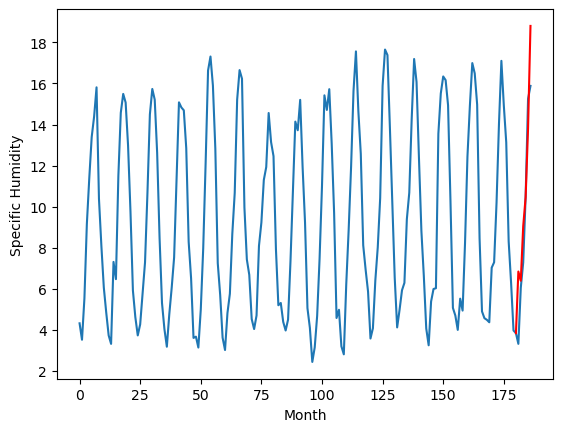

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.69		0.20
5.68		6.08		0.40
8.29		8.78		0.49
9.45		10.05		0.60
13.67		13.59		-0.08
16.81		18.03		1.22
[180, 181, 182, 183, 184, 185, 186]
[3.73, 6.685947315692902, 6.0814875531196595, 8.775595562458038, 10.049218313694, 13.587469952106476, 18.033344643115996]


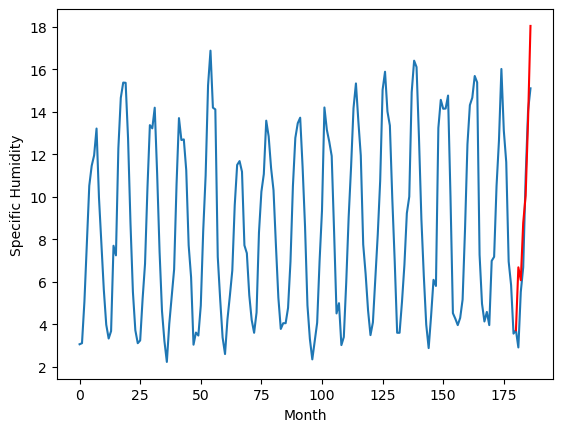

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.99		0.28
1.97		2.42		0.45
3.79		4.52		0.73
3.96		5.70		1.74
9.11		8.65		-0.46
12.10		12.60		0.50
[180, 181, 182, 183, 184, 185, 186]
[2.83, 2.9899779450893402, 2.4229323756694794, 4.520199049711227, 5.70299600481987, 8.648084868192672, 12.602102507352829]


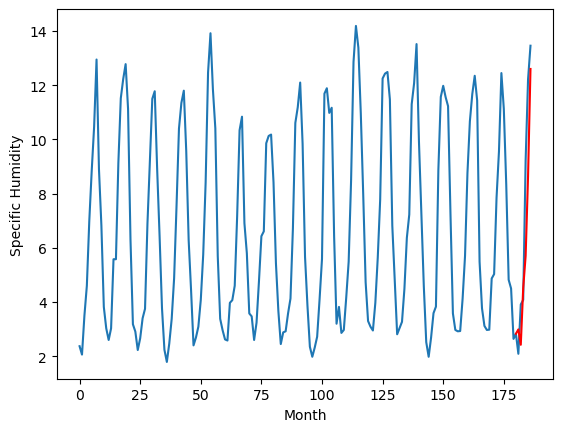

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.61		0.53
4.12		4.54		0.42
5.36		5.96		0.60
6.73		7.75		1.02
8.26		9.47		1.21
13.58		15.05		1.47
[180, 181, 182, 183, 184, 185, 186]
[2.69, 4.607905087471008, 4.543446851372718, 5.958207083344459, 7.747500730156898, 9.467931104302405, 15.048532796502112]


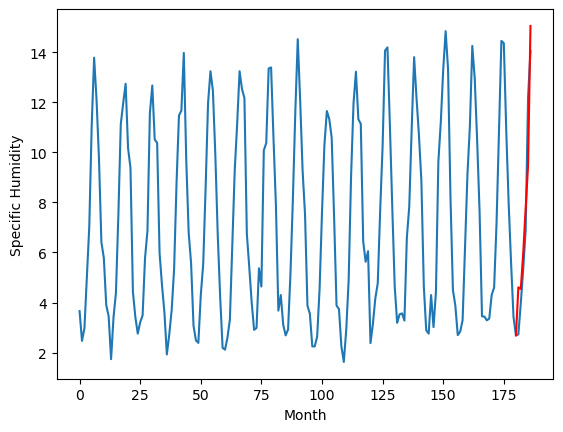

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.868907695114612, 4.357603572010994, 3.188411526083946, 2.705667997598648, 6.7660450267791745, 5.338324440717697, 5.793131731897592, 6.841184053421021, 6.685947315692902, 2.9899779450893402, 4.607905087471008]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.868908
1                 1    4.34   4.357604
2                 2    3.22   3.188412
3                 3    2.03   2.705668
4                 4    6.18   6.766045
5                 5    5.75   5.338324
6                 6    5.66   5.793132
7                 7    6.53   6.841184
8                 8    6.49   6.685947
9                 9    2.71   2.989978
10               10    4.08   4.607905


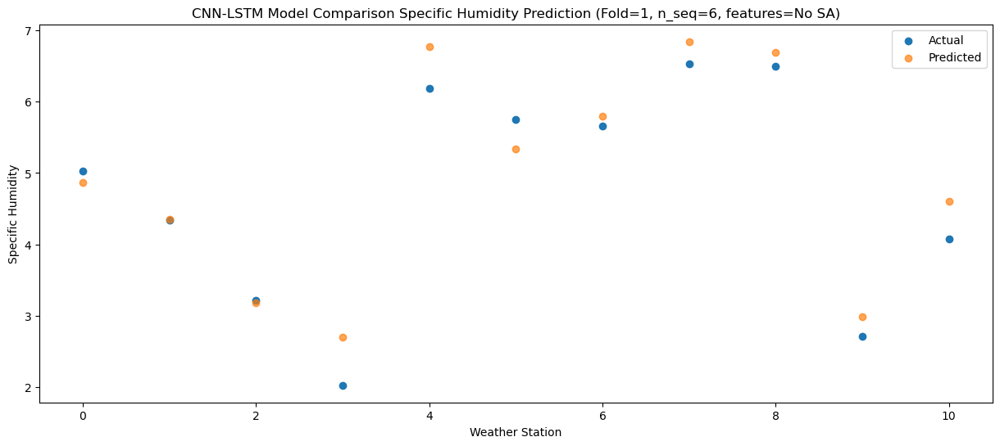

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35   4.965599
1                 1    4.53   4.257116
2                 2    3.22   3.062277
3                 3    2.10   2.334368
4                 4    6.22   6.362280
5                 5    5.12   4.963339
6                 6    5.78   5.718261
7                 7    6.01   6.393376
8                 8    5.68   6.081488
9                 9    1.97   2.422932
10               10    4.12   4.543447


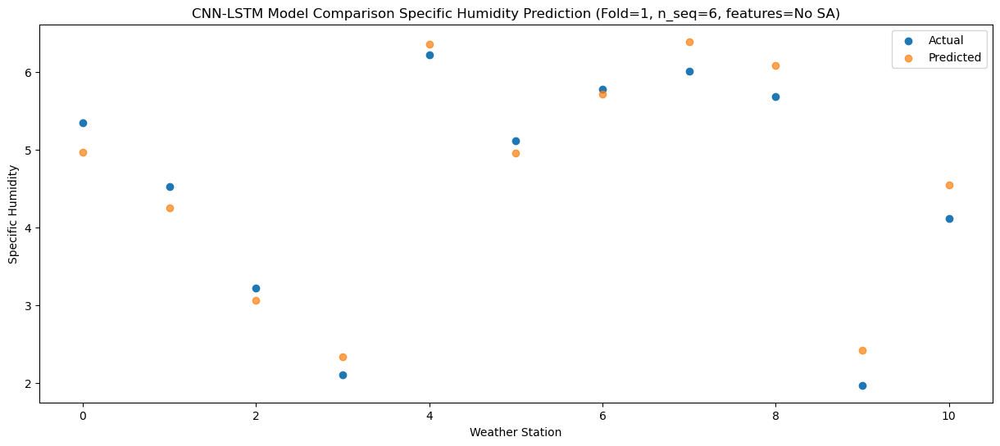

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   6.733337
1                 1    6.06   6.282305
2                 2    5.84   5.314076
3                 3    4.74   4.907284
4                 4    8.94   8.992424
5                 5    5.91   6.832623
6                 6    7.34   7.684134
7                 7    8.74   9.047254
8                 8    8.29   8.775596
9                 9    3.79   4.520199
10               10    5.36   5.958207


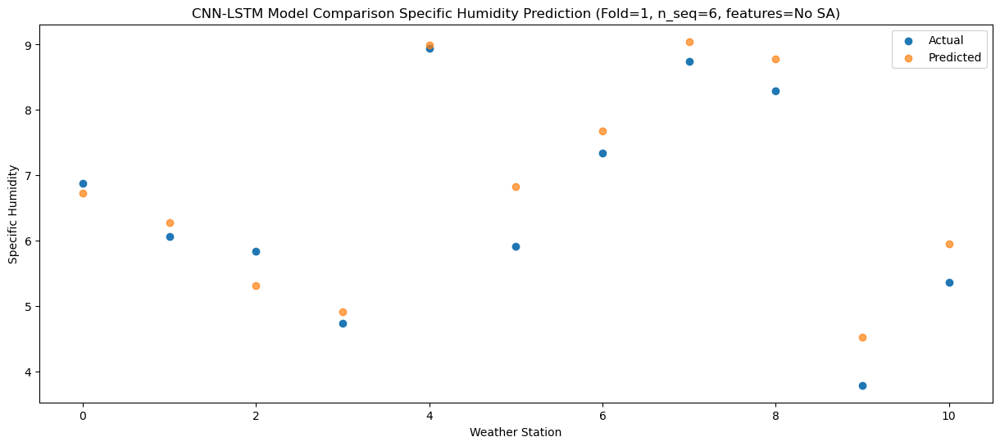

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.08   8.188854
1                 1    6.42   7.787654
2                 2    5.55   6.733505
3                 3    6.08   6.155497
4                 4   10.20  10.244587
5                 5    7.21   8.043756
6                 6    7.96   9.201617
7                 7    9.97  10.462003
8                 8    9.45  10.049218
9                 9    3.96   5.702996
10               10    6.73   7.747501


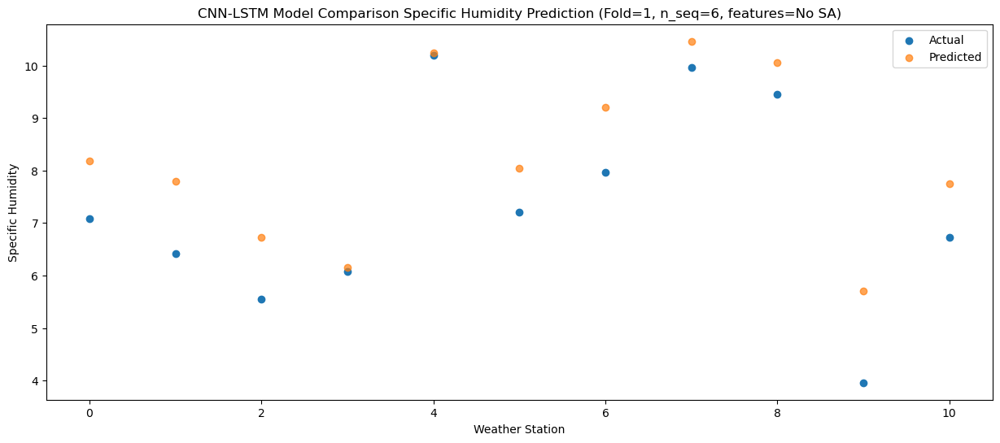

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    9.76  10.558981
1                 1    9.34  10.385129
2                 2    8.39   9.652420
3                 3    9.97   9.590503
4                 4   14.23  13.735441
5                 5   11.52  10.722808
6                 6   10.89  11.725834
7                 7   13.18  13.812915
8                 8   13.67  13.587470
9                 9    9.11   8.648085
10               10    8.26   9.467931


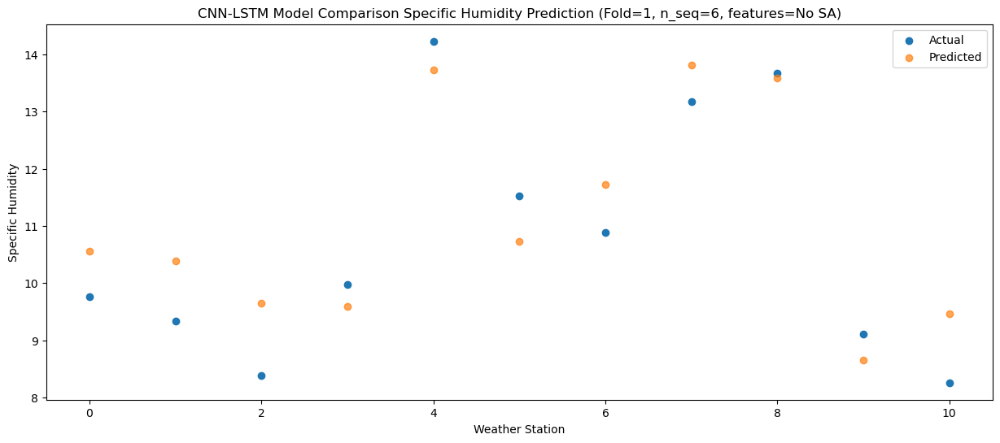

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.92  15.799250
1                 1   13.32  15.661687
2                 2   12.91  14.806985
3                 3   13.16  14.177444
4                 4   17.64  18.324217
5                 5   13.69  14.831570
6                 6   15.24  17.030558
7                 7   17.94  18.800027
8                 8   16.81  18.033345
9                 9   12.10  12.602103
10               10   13.58  15.048533


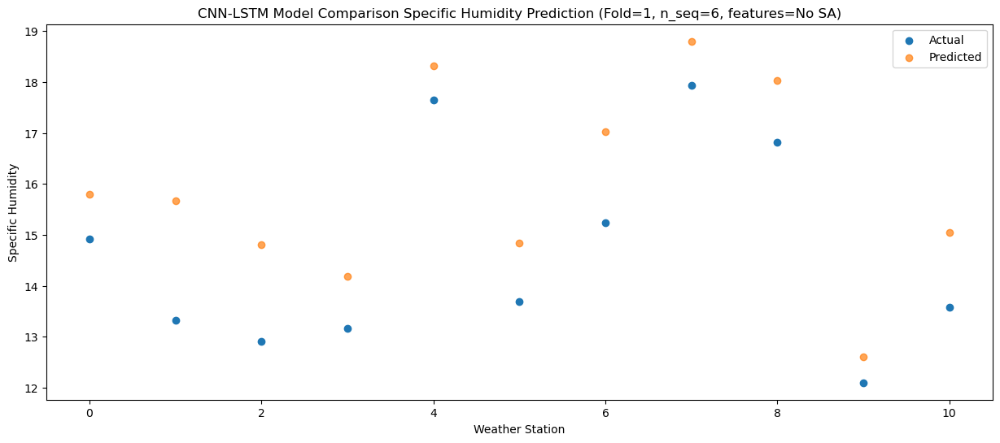

Model: "sequential_1007"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1007 (Conv1D)        (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_1007 (MaxPool  (None, 1, 512)           0         
 ing1D)                                                          
                                                                 
 dropout_3021 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_2014 (LSTM)            (None, 1, 512)            2099200   
                                                                 
 dropout_3022 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_2015 (LSTM)            (None, 512)               2099200   
                                                   

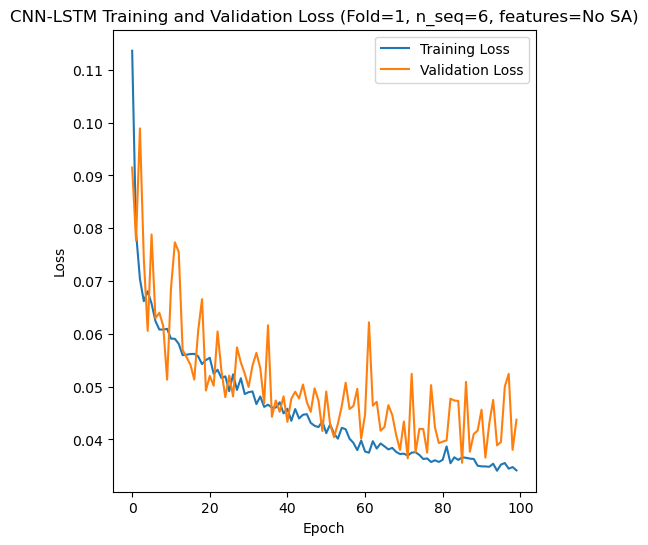

Epoch 1/100
84/84 [==============================] - 20s 53ms/step - loss: 0.1159 - accuracy: 0.6429 - mae: 0.1015 - rmse: 0.1159 - mape: 17.3729 - pearson: 0.5746 - val_loss: 0.0563 - val_accuracy: 1.0000 - val_mae: 0.0475 - val_rmse: 0.0563 - val_mape: 8.0891 - val_pearson: 0.8171
Epoch 2/100
84/84 [==============================] - 1s 18ms/step - loss: 0.0780 - accuracy: 0.6667 - mae: 0.0639 - rmse: 0.0780 - mape: 10.9097 - pearson: 0.6481 - val_loss: 0.0877 - val_accuracy: 0.0000e+00 - val_mae: 0.0692 - val_rmse: 0.0877 - val_mape: 11.3431 - val_pearson: 0.6018
Epoch 3/100
84/84 [==============================] - 1s 17ms/step - loss: 0.0727 - accuracy: 0.7262 - mae: 0.0594 - rmse: 0.0727 - mape: 10.0581 - pearson: 0.6848 - val_loss: 0.0841 - val_accuracy: 1.0000 - val_mae: 0.0705 - val_rmse: 0.0841 - val_mape: 11.3246 - val_pearson: 0.6697
Epoch 4/100
84/84 [==============================] - 1s 17ms/step - loss: 0.0690 - accuracy: 0.7262 - mae: 0.0561 - rmse: 0.0690 - mape: 9.5180 

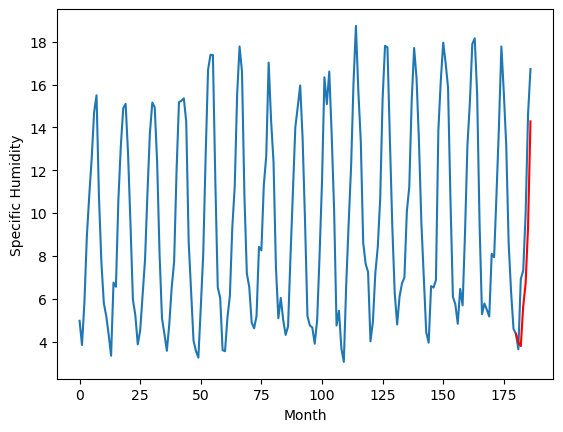

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		1.41		-0.43
1.16		1.15		-0.01
3.01		2.66		-0.35
3.13		3.52		0.39
8.25		6.01		-2.24
11.16		10.09		-1.07
[180, 181, 182, 183, 184, 185, 186]
[2.82, 1.4134190225601195, 1.1476974630355834, 2.6594835662841794, 3.5196139955520627, 6.012892260551452, 10.091239943504334]


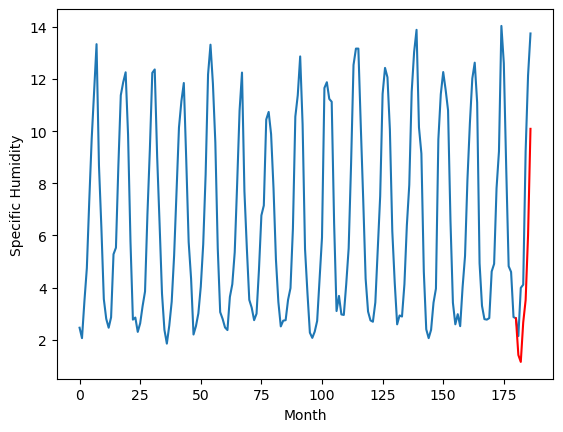

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		4.42		-1.11
7.66		4.75		-2.91
7.88		5.62		-2.26
8.85		6.67		-2.18
10.16		8.29		-1.87
13.94		13.09		-0.85
[180, 181, 182, 183, 184, 185, 186]
[9.16, 4.416978635787964, 4.753791459798813, 5.624249407052994, 6.67154211640358, 8.29311854481697, 13.087422915697097]


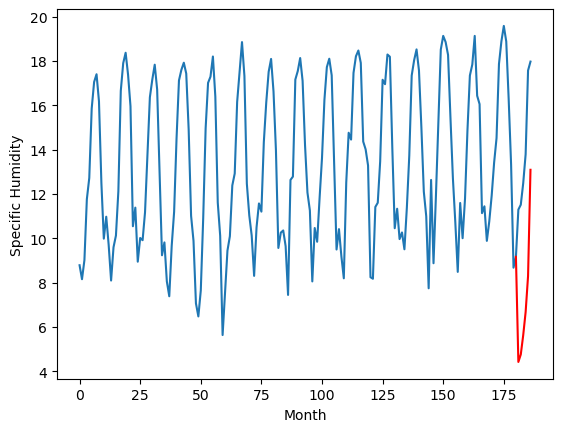

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		4.20		0.22
4.15		4.21		0.06
4.79		5.12		0.33
6.14		6.50		0.36
7.82		7.82		-0.00
12.42		12.96		0.54
[180, 181, 182, 183, 184, 185, 186]
[2.44, 4.202532289028167, 4.211023073121905, 5.120453874990344, 6.495164434835314, 7.816215555593371, 12.955113928243517]


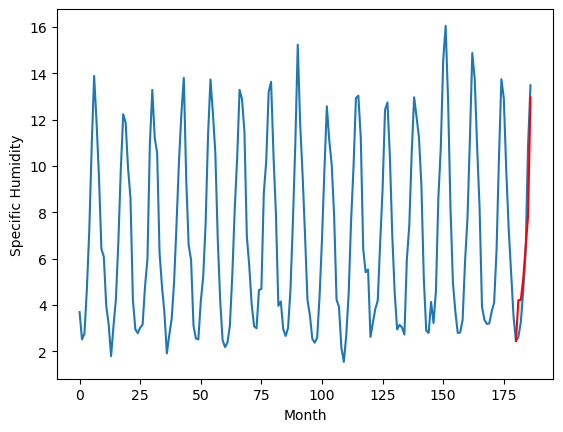

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		4.37		-0.73
5.08		4.48		-0.60
8.37		6.05		-2.32
8.39		7.05		-1.34
11.59		9.48		-2.11
15.48		14.37		-1.11
[180, 181, 182, 183, 184, 185, 186]
[6.65, 4.369736583232879, 4.475532138049602, 6.04519232481718, 7.049984419047832, 9.477065765559672, 14.36899682253599]


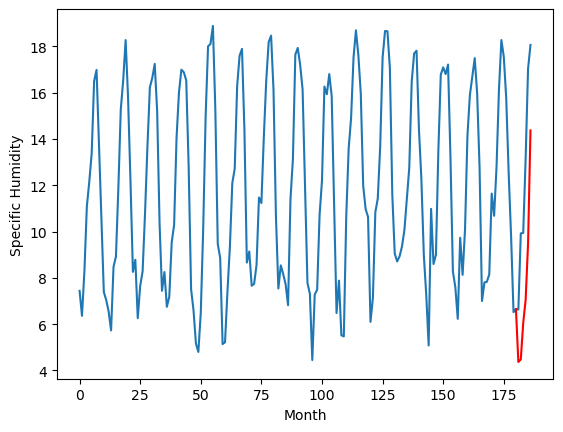

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		1.90		-0.43
2.28		1.81		-0.47
5.27		3.58		-1.69
6.84		4.55		-2.29
11.67		7.23		-4.44
14.31		11.90		-2.41
[180, 181, 182, 183, 184, 185, 186]
[6.19, 1.8994824504852295, 1.8110362803936004, 3.5755291497707367, 4.545000663995743, 7.230007997751236, 11.901286474466325]


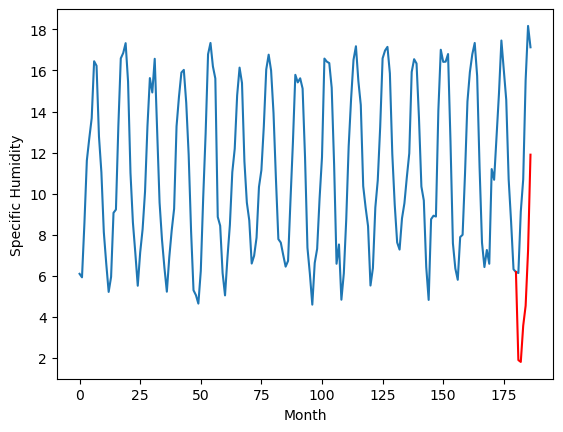

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.23		-0.45
8.35		8.02		-0.33
11.21		9.96		-1.25
12.53		10.91		-1.62
16.73		13.80		-2.93
20.48		18.40		-2.08
[180, 181, 182, 183, 184, 185, 186]
[4.78, 8.23494544506073, 8.0170807826519, 9.957135437726974, 10.911201893091201, 13.800954757928848, 18.402158199548722]


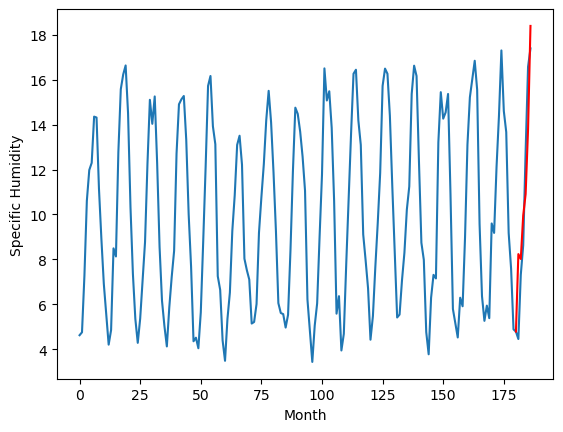

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.27		-0.70
3.84		3.34		-0.50
3.93		4.03		0.10
4.23		4.82		0.59
4.35		6.47		2.12
7.01		10.24		3.23
[180, 181, 182, 183, 184, 185, 186]
[2.61, 3.271334739923477, 3.335182356238365, 4.030042099356651, 4.821549522280693, 6.471880542635917, 10.24179588496685]


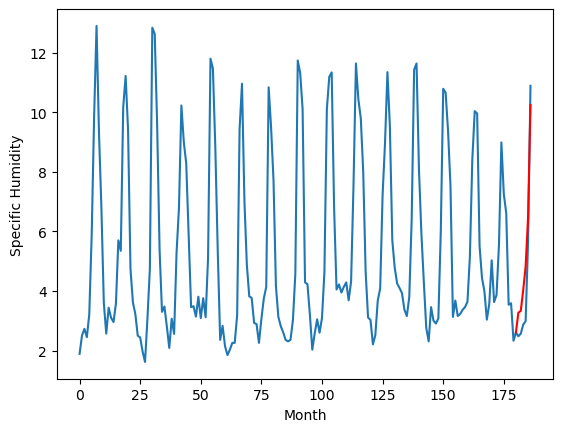

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.05		-1.24
8.82		7.17		-1.65
8.93		7.09		-1.84
10.25		7.88		-2.37
11.73		8.58		-3.15
12.98		11.94		-1.04
[180, 181, 182, 183, 184, 185, 186]
[4.6, 7.0450682663917545, 7.16913857549429, 7.091133418083191, 7.884266319274903, 8.58400339126587, 11.93992871284485]


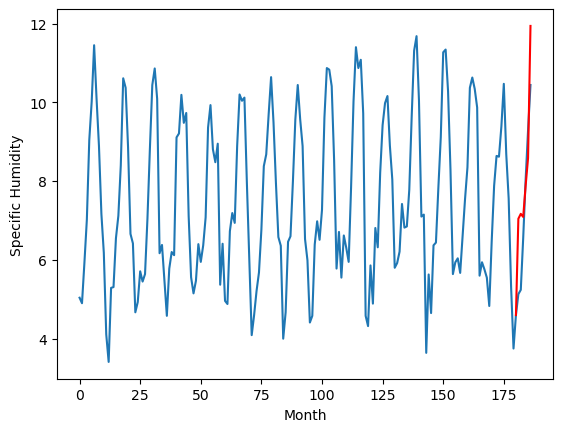

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		5.38		-0.60
6.05		5.45		-0.60
7.78		6.87		-0.91
8.31		8.04		-0.27
11.02		10.13		-0.89
15.52		15.25		-0.27
[180, 181, 182, 183, 184, 185, 186]
[4.27, 5.381542658805847, 5.453959172964096, 6.874464458227157, 8.035391396284103, 10.133242672681808, 15.247564858198166]


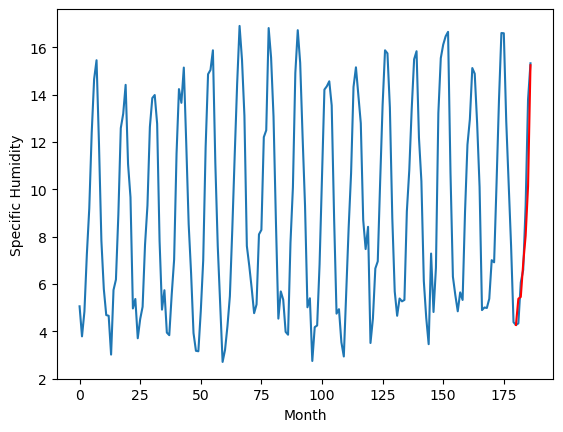

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		3.87		-0.76
4.87		3.89		-0.98
5.90		5.26		-0.64
6.51		6.47		-0.04
9.18		8.44		-0.74
13.28		13.58		0.30
[180, 181, 182, 183, 184, 185, 186]
[3.91, 3.865185196399689, 3.893264901712537, 5.2556039214879275, 6.471730601862073, 8.443770659044386, 13.582573187425734]


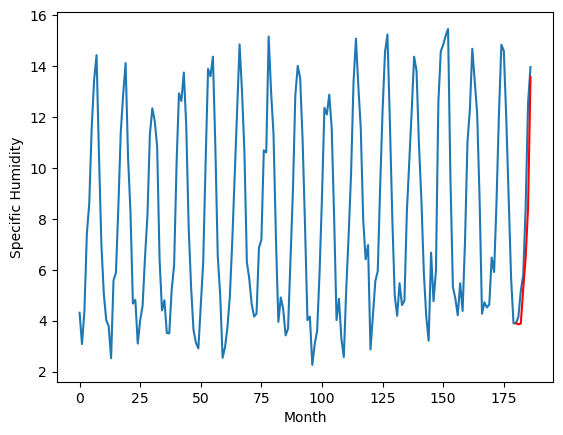

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[3.966825659275055, 1.4134190225601195, 4.416978635787964, 4.202532289028167, 4.369736583232879, 1.8994824504852295, 8.23494544506073, 3.271334739923477, 7.0450682663917545, 5.381542658805847, 3.865185196399689]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   3.966826
1                 1    1.84   1.413419
2                 2    5.53   4.416979
3                 3    3.98   4.202532
4                 4    5.10   4.369737
5                 5    2.33   1.899482
6                 6    8.68   8.234945
7                 7    3.97   3.271335
8                 8    8.29   7.045068
9                 9    5.98   5.381543
10               10    4.63   3.865185


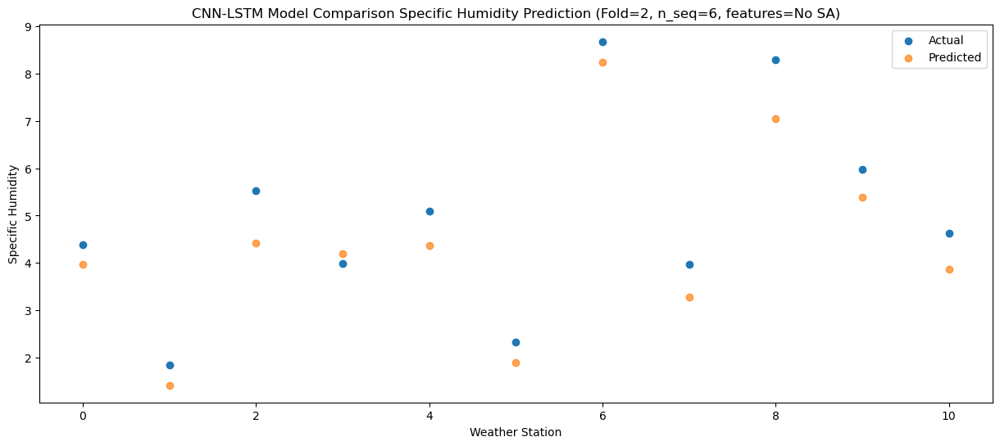

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   3.783930
1                 1    1.16   1.147697
2                 2    7.66   4.753791
3                 3    4.15   4.211023
4                 4    5.08   4.475532
5                 5    2.28   1.811036
6                 6    8.35   8.017081
7                 7    3.84   3.335182
8                 8    8.82   7.169139
9                 9    6.05   5.453959
10               10    4.87   3.893265


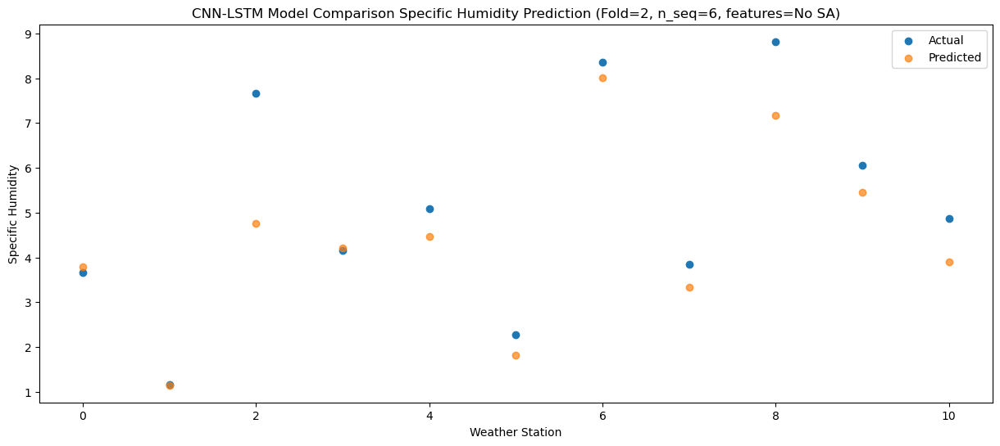

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   5.646721
1                 1    3.01   2.659484
2                 2    7.88   5.624249
3                 3    4.79   5.120454
4                 4    8.37   6.045192
5                 5    5.27   3.575529
6                 6   11.21   9.957135
7                 7    3.93   4.030042
8                 8    8.93   7.091133
9                 9    7.78   6.874464
10               10    5.90   5.255604


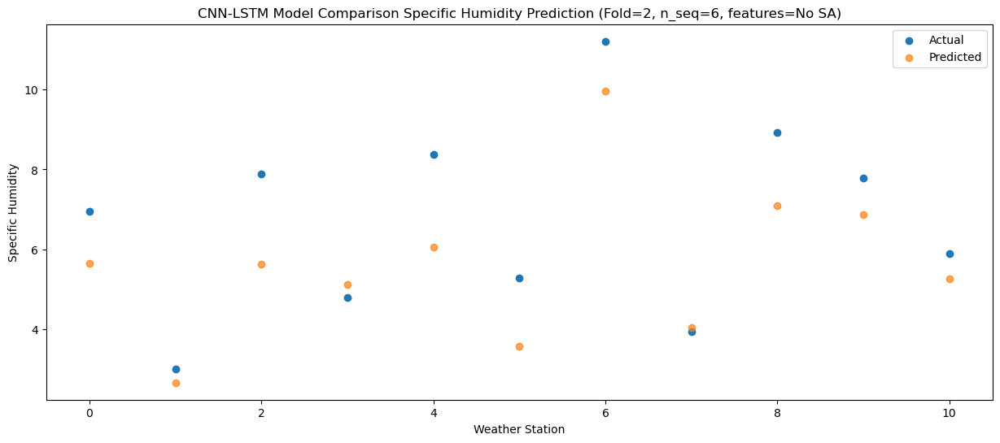

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.34   6.725063
1                 1    3.13   3.519614
2                 2    8.85   6.671542
3                 3    6.14   6.495164
4                 4    8.39   7.049984
5                 5    6.84   4.545001
6                 6   12.53  10.911202
7                 7    4.23   4.821550
8                 8   10.25   7.884266
9                 9    8.31   8.035391
10               10    6.51   6.471731


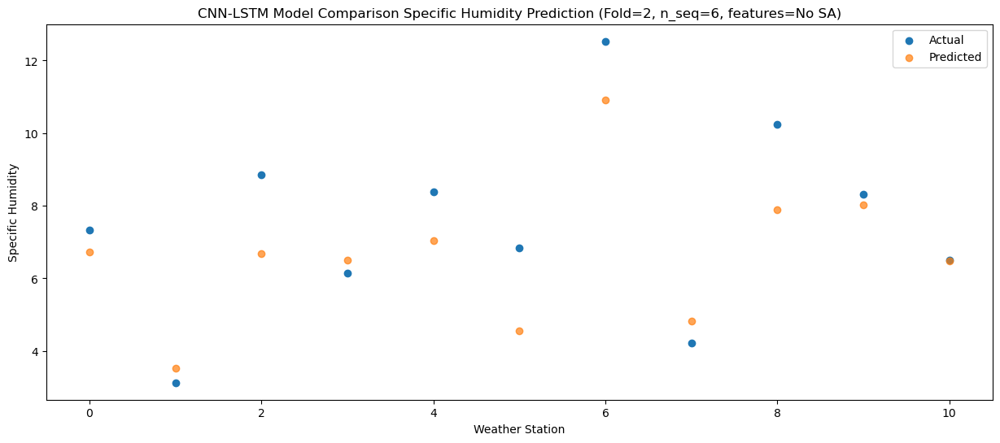

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.01   9.364843
1                 1    8.25   6.012892
2                 2   10.16   8.293119
3                 3    7.82   7.816216
4                 4   11.59   9.477066
5                 5   11.67   7.230008
6                 6   16.73  13.800955
7                 7    4.35   6.471881
8                 8   11.73   8.584003
9                 9   11.02  10.133243
10               10    9.18   8.443771


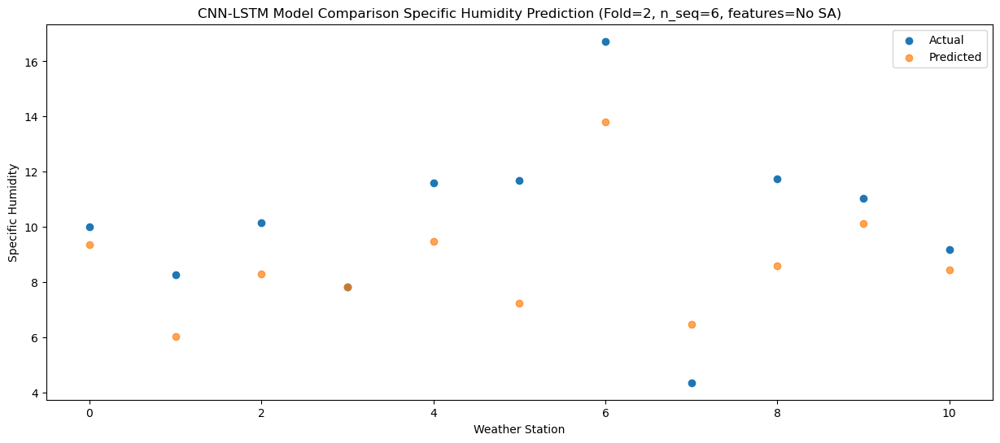

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.66  14.283456
1                 1   11.16  10.091240
2                 2   13.94  13.087423
3                 3   12.42  12.955114
4                 4   15.48  14.368997
5                 5   14.31  11.901286
6                 6   20.48  18.402158
7                 7    7.01  10.241796
8                 8   12.98  11.939929
9                 9   15.52  15.247565
10               10   13.28  13.582573


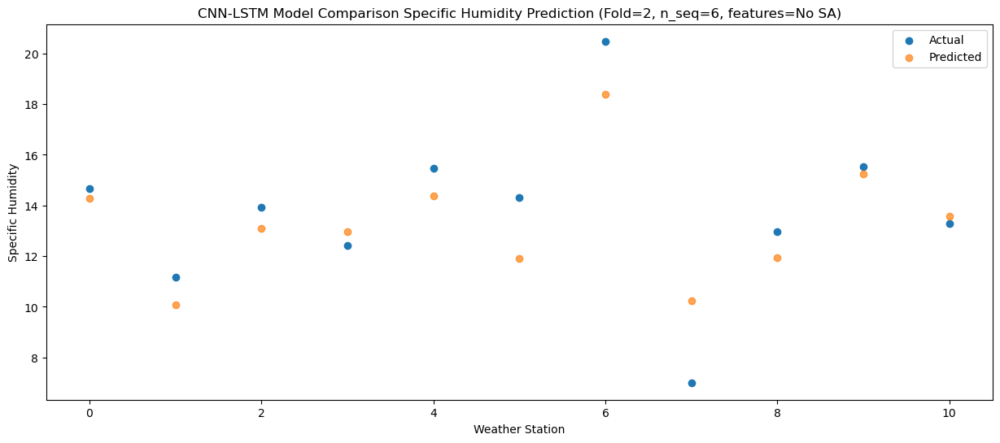

Model: "sequential_1008"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1008 (Conv1D)        (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_1008 (MaxPool  (None, 1, 512)           0         
 ing1D)                                                          
                                                                 
 dropout_3024 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_2016 (LSTM)            (None, 1, 512)            2099200   
                                                                 
 dropout_3025 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_2017 (LSTM)            (None, 512)               2099200   
                                                   

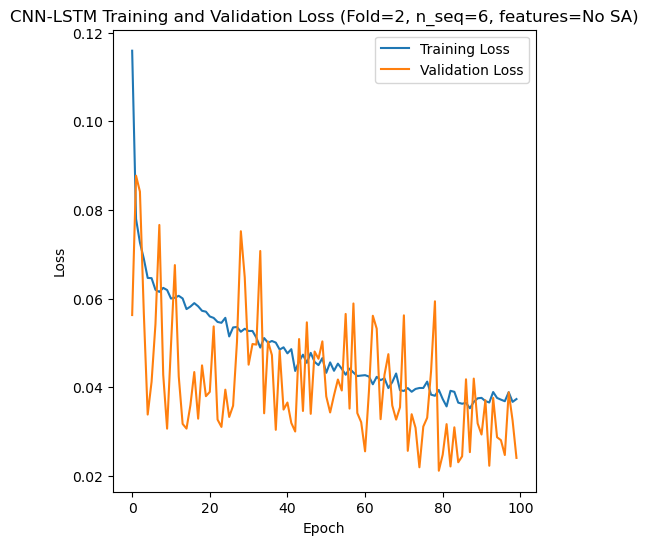

Epoch 1/100
84/84 [==============================] - 6s 30ms/step - loss: 0.1148 - accuracy: 0.6310 - mae: 0.1000 - rmse: 0.1148 - mape: 16.8228 - pearson: 0.5896 - val_loss: 0.1110 - val_accuracy: 0.1000 - val_mae: 0.0854 - val_rmse: 0.1110 - val_mape: 14.5991 - val_pearson: 0.5229
Epoch 2/100
84/84 [==============================] - 1s 16ms/step - loss: 0.0727 - accuracy: 0.6548 - mae: 0.0598 - rmse: 0.0727 - mape: 10.1738 - pearson: 0.6571 - val_loss: 0.0921 - val_accuracy: 0.9000 - val_mae: 0.0764 - val_rmse: 0.0921 - val_mape: 13.1155 - val_pearson: 0.7472
Epoch 3/100
84/84 [==============================] - 1s 17ms/step - loss: 0.0697 - accuracy: 0.6190 - mae: 0.0564 - rmse: 0.0697 - mape: 9.3473 - pearson: 0.7105 - val_loss: 0.0605 - val_accuracy: 0.9000 - val_mae: 0.0489 - val_rmse: 0.0605 - val_mape: 8.5778 - val_pearson: 0.7994
Epoch 4/100
84/84 [==============================] - 2s 19ms/step - loss: 0.0682 - accuracy: 0.6905 - mae: 0.0559 - rmse: 0.0682 - mape: 9.3292 - pear

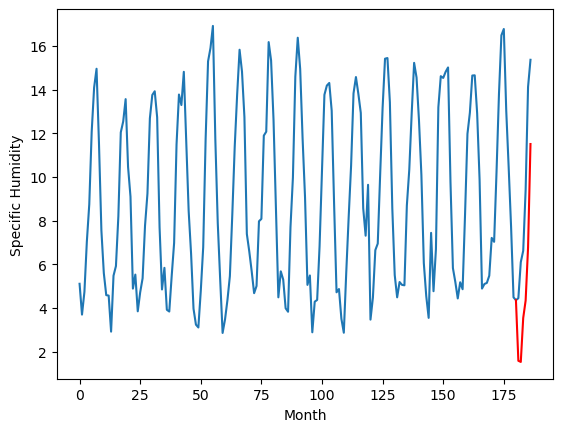

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.70		0.06
2.08		2.04		-0.04
4.59		4.61		0.02
5.76		5.40		-0.36
9.28		8.48		-0.80
13.81		12.76		-1.05
[180, 181, 182, 183, 184, 185, 186]
[3.43, 2.6974201272428036, 2.03761906132102, 4.613239712566138, 5.401542014926672, 8.481399125903845, 12.764222211688757]


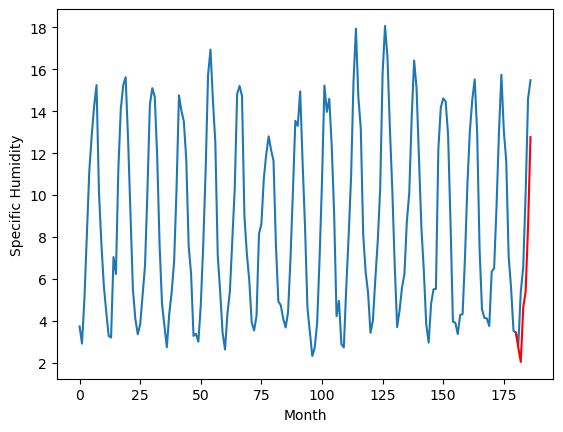

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		6.35		-0.02
6.31		6.22		-0.09
6.39		6.82		0.43
7.01		7.02		0.01
7.41		9.13		1.72
9.86		11.48		1.62
[180, 181, 182, 183, 184, 185, 186]
[5.43, 6.353397183418274, 6.21687897324562, 6.82290902018547, 7.019156597852707, 9.129364870786667, 11.48005857348442]


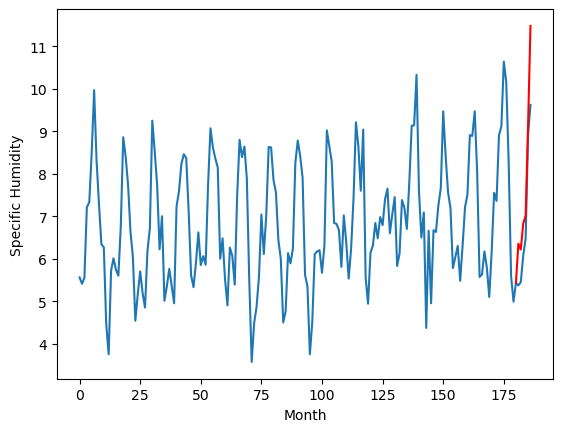

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.47		0.03
3.37		3.10		-0.27
4.67		5.15		0.48
5.86		6.15		0.29
8.39		8.43		0.04
13.81		13.29		-0.52
[180, 181, 182, 183, 184, 185, 186]
[3.21, 3.4664622908830642, 3.1032928889989853, 5.153479046225548, 6.152481085658073, 8.428346402049065, 13.286543137431146]


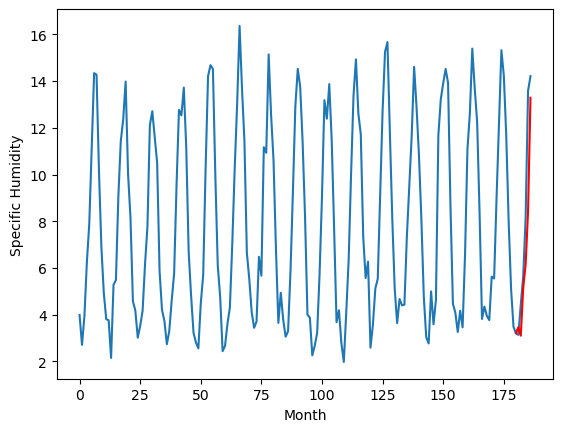

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		4.93		0.02
4.08		4.27		0.19
6.56		6.59		0.03
7.62		7.55		-0.07
10.04		10.16		0.12
14.50		14.75		0.25
[180, 181, 182, 183, 184, 185, 186]
[3.04, 4.926830918192864, 4.267378897070885, 6.587911695837975, 7.551787406802178, 10.156267434954643, 14.750903398394584]


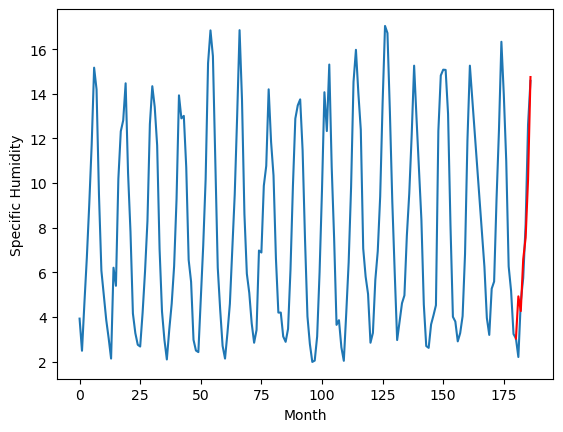

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.47		0.05
2.90		2.91		0.01
4.93		5.12		0.19
6.23		6.17		-0.06
8.47		8.54		0.07
13.69		13.39		-0.30
[180, 181, 182, 183, 184, 185, 186]
[2.91, 3.466735016107559, 2.9056264865398407, 5.117034147977829, 6.166727732419968, 8.544389914274216, 13.385778139829636]


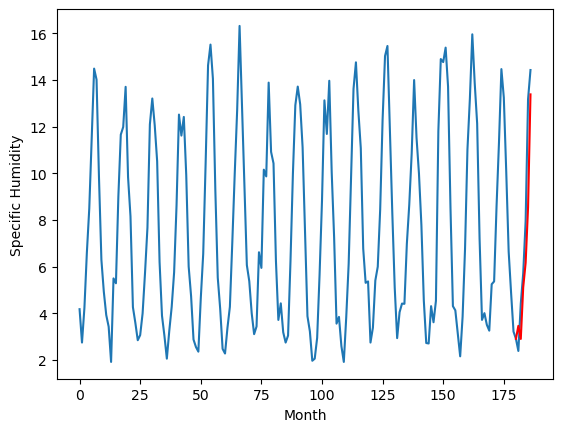

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.90		0.17
5.79		5.62		-0.17
6.10		6.85		0.75
6.57		7.16		0.59
7.97		9.67		1.70
9.30		12.49		3.19
[180, 181, 182, 183, 184, 185, 186]
[1.6, 5.901801285743713, 5.623510984182357, 6.8492826497554775, 7.16473221540451, 9.668824908733367, 12.491876361370085]


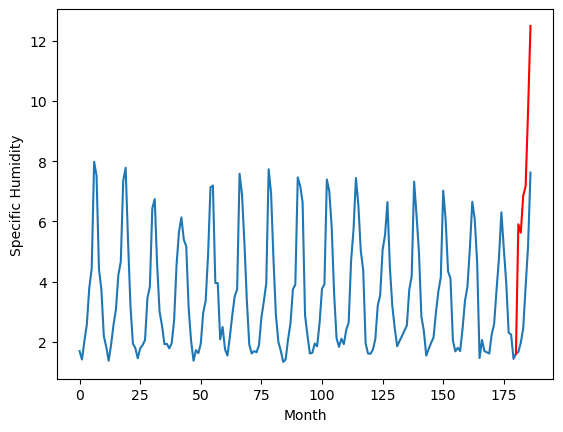

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		4.44		-0.36
4.32		4.23		-0.09
4.62		4.95		0.33
4.31		5.13		0.82
4.87		7.37		2.50
6.29		9.66		3.37
[180, 181, 182, 183, 184, 185, 186]
[2.86, 4.4374053978919985, 4.22526169359684, 4.953230684399605, 5.127930497527123, 7.373276090025902, 9.663431500792504]


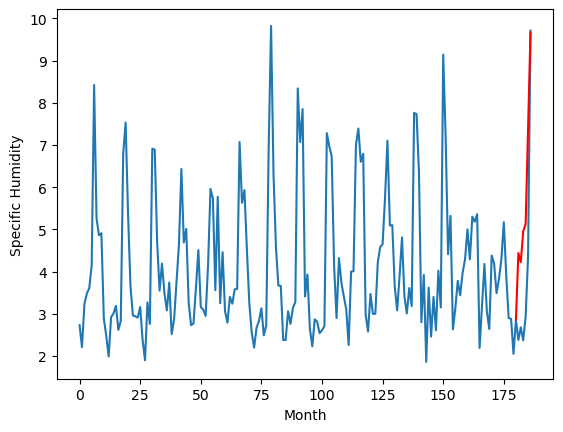

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		4.34		-0.26
4.25		4.28		0.03
3.90		4.84		0.94
4.83		5.06		0.23
5.27		7.08		1.81
6.70		9.55		2.85
[180, 181, 182, 183, 184, 185, 186]
[5.65, 4.337945990562439, 4.28293810069561, 4.843387045264244, 5.0615574944019315, 7.079688750505447, 9.549846373796463]


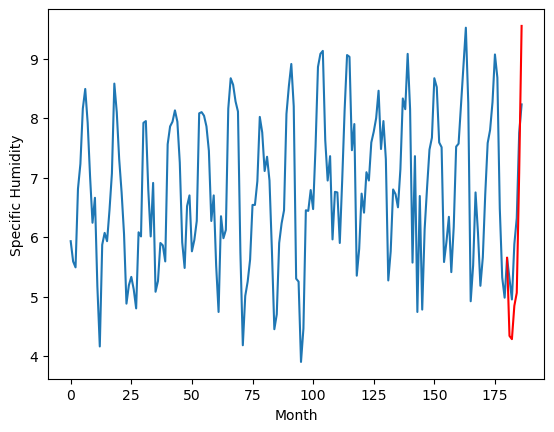

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		3.89		0.80
3.24		3.60		0.36
4.02		5.06		1.04
5.40		6.11		0.71
6.97		7.82		0.85
11.87		12.54		0.67
[180, 181, 182, 183, 184, 185, 186]
[2.54, 3.8948421108722684, 3.5995953309535977, 5.063039087057113, 6.109903835058212, 7.822942160367965, 12.543948076963424]


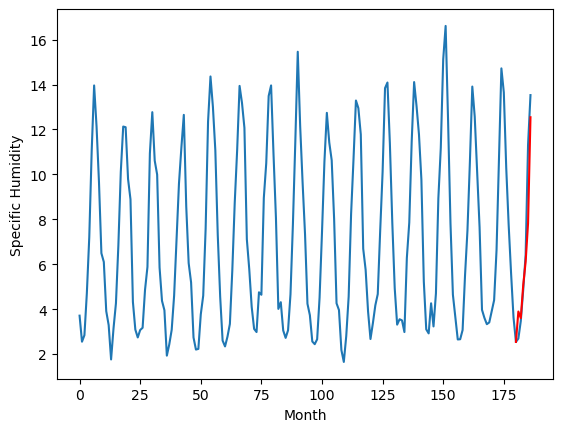

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.36		0.36
0.86		1.05		0.19
2.14		2.68		0.54
3.55		3.78		0.23
5.14		5.58		0.44
10.01		10.48		0.47
[180, 181, 182, 183, 184, 185, 186]
[2.51, 1.364899786710739, 1.046023758649826, 2.6821521842479705, 3.779870899915695, 5.58037737250328, 10.484919818639755]


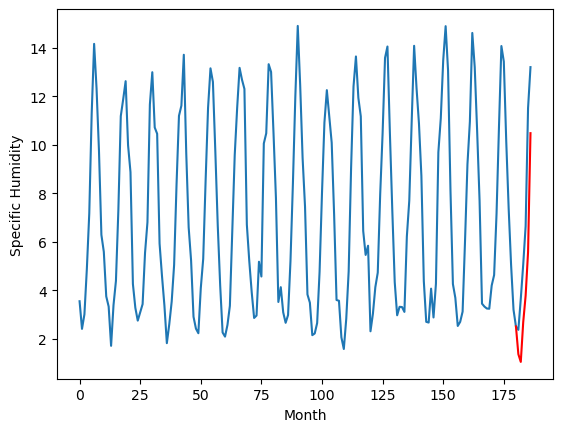

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.5862989002466201, 2.6974201272428036, 6.353397183418274, 3.4664622908830642, 4.926830918192864, 3.466735016107559, 5.901801285743713, 4.4374053978919985, 4.337945990562439, 3.8948421108722684, 1.364899786710739]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.586299
1                 1    2.64   2.697420
2                 2    6.37   6.353397
3                 3    3.44   3.466462
4                 4    4.91   4.926831
5                 5    3.42   3.466735
6                 6    5.73   5.901801
7                 7    4.80   4.437405
8                 8    4.60   4.337946
9                 9    3.09   3.894842
10               10    1.00   1.364900


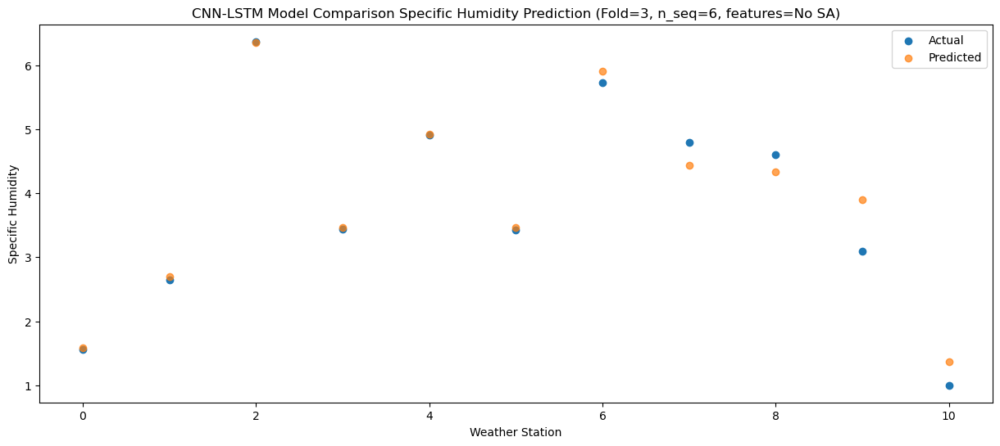

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   1.534171
1                 1    2.08   2.037619
2                 2    6.31   6.216879
3                 3    3.37   3.103293
4                 4    4.08   4.267379
5                 5    2.90   2.905626
6                 6    5.79   5.623511
7                 7    4.32   4.225262
8                 8    4.25   4.282938
9                 9    3.24   3.599595
10               10    0.86   1.046024


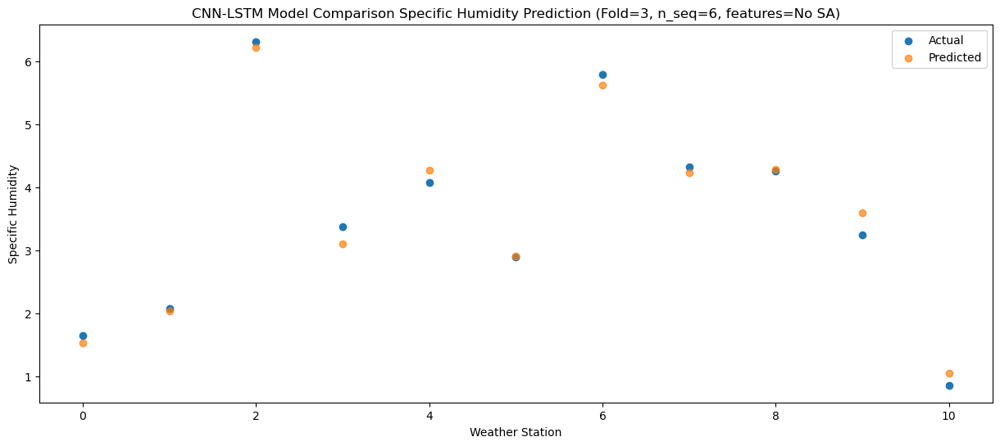

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   3.542530
1                 1    4.59   4.613240
2                 2    6.39   6.822909
3                 3    4.67   5.153479
4                 4    6.56   6.587912
5                 5    4.93   5.117034
6                 6    6.10   6.849283
7                 7    4.62   4.953231
8                 8    3.90   4.843387
9                 9    4.02   5.063039
10               10    2.14   2.682152


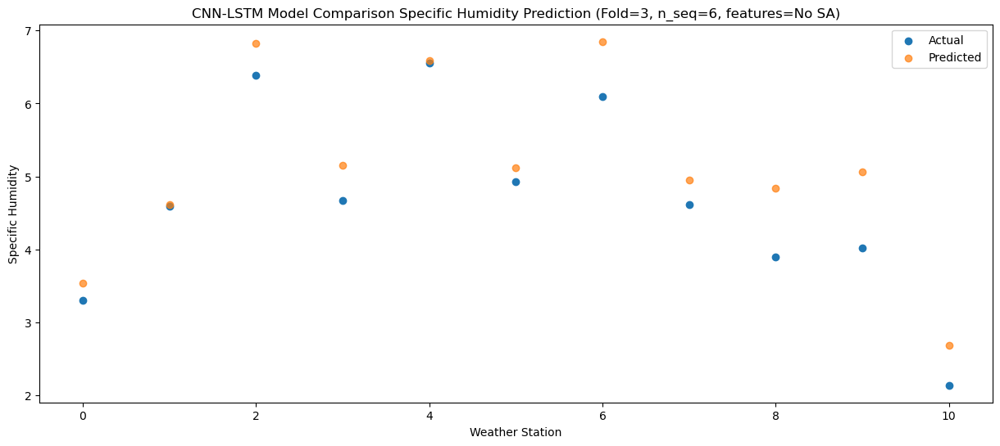

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    3.82   4.343221
1                 1    5.76   5.401542
2                 2    7.01   7.019157
3                 3    5.86   6.152481
4                 4    7.62   7.551787
5                 5    6.23   6.166728
6                 6    6.57   7.164732
7                 7    4.31   5.127930
8                 8    4.83   5.061557
9                 9    5.40   6.109904
10               10    3.55   3.779871


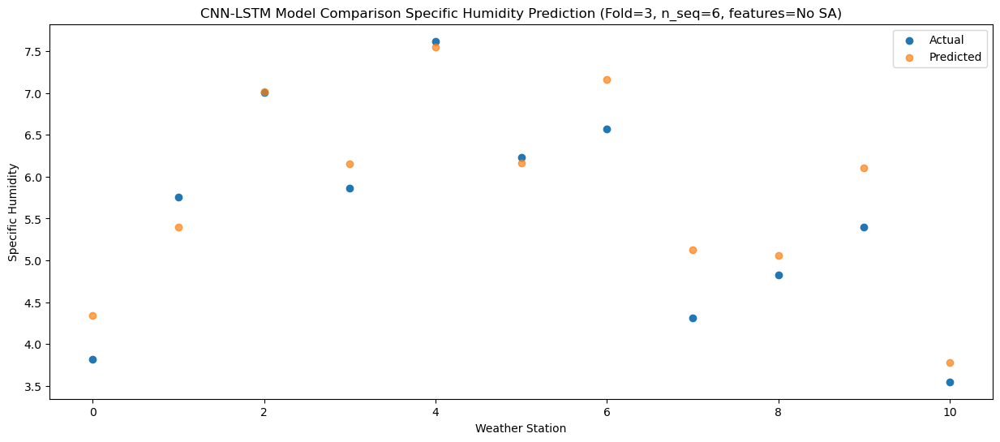

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    6.60   6.771941
1                 1    9.28   8.481399
2                 2    7.41   9.129365
3                 3    8.39   8.428346
4                 4   10.04  10.156267
5                 5    8.47   8.544390
6                 6    7.97   9.668825
7                 7    4.87   7.373276
8                 8    5.27   7.079689
9                 9    6.97   7.822942
10               10    5.14   5.580377


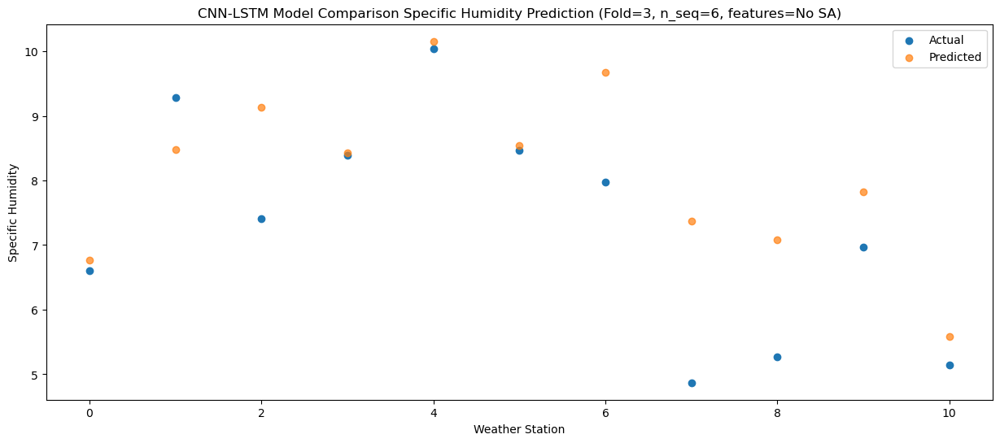

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   11.32  11.505803
1                 1   13.81  12.764222
2                 2    9.86  11.480059
3                 3   13.81  13.286543
4                 4   14.50  14.750903
5                 5   13.69  13.385778
6                 6    9.30  12.491876
7                 7    6.29   9.663432
8                 8    6.70   9.549846
9                 9   11.87  12.543948
10               10   10.01  10.484920


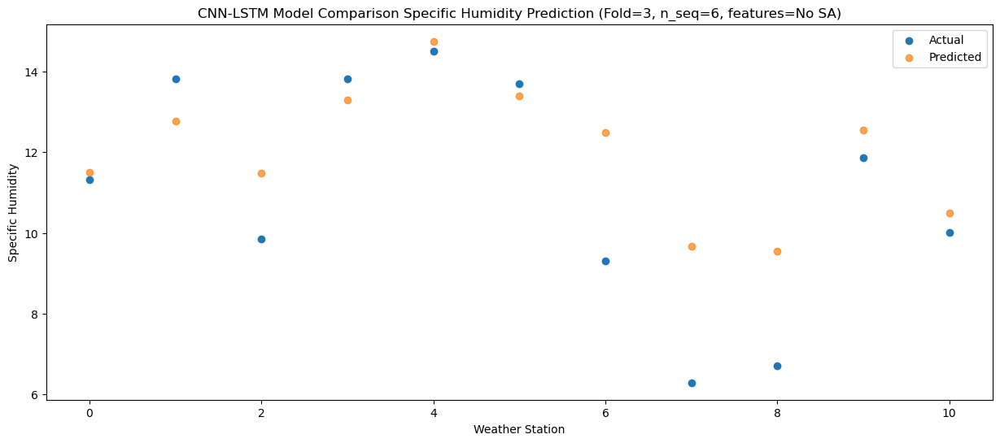

Model: "sequential_1009"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1009 (Conv1D)        (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_1009 (MaxPool  (None, 1, 512)           0         
 ing1D)                                                          
                                                                 
 dropout_3027 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_2018 (LSTM)            (None, 1, 512)            2099200   
                                                                 
 dropout_3028 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_2019 (LSTM)            (None, 512)               2099200   
                                                   

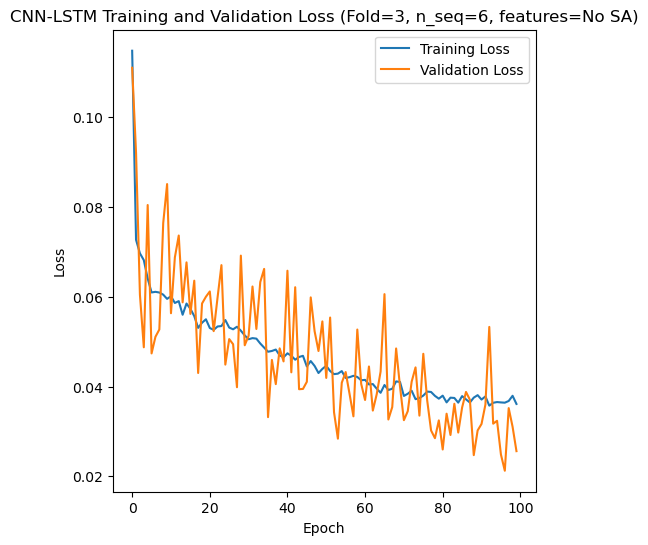

Epoch 1/100
84/84 [==============================] - 19s 90ms/step - loss: 0.1197 - accuracy: 0.5833 - mae: 0.1040 - rmse: 0.1197 - mape: 17.6220 - pearson: 0.5447 - val_loss: 0.0626 - val_accuracy: 1.0000 - val_mae: 0.0505 - val_rmse: 0.0626 - val_mape: 8.3304 - val_pearson: 0.7771
Epoch 2/100
84/84 [==============================] - 3s 38ms/step - loss: 0.0819 - accuracy: 0.7143 - mae: 0.0675 - rmse: 0.0819 - mape: 11.4822 - pearson: 0.6220 - val_loss: 0.0588 - val_accuracy: 1.0000 - val_mae: 0.0499 - val_rmse: 0.0588 - val_mape: 9.2421 - val_pearson: 0.7474
Epoch 3/100
84/84 [==============================] - 3s 38ms/step - loss: 0.0703 - accuracy: 0.7143 - mae: 0.0577 - rmse: 0.0703 - mape: 9.8352 - pearson: 0.6820 - val_loss: 0.1106 - val_accuracy: 0.0000e+00 - val_mae: 0.0837 - val_rmse: 0.1106 - val_mape: 13.8410 - val_pearson: 0.3943
Epoch 4/100
84/84 [==============================] - 3s 40ms/step - loss: 0.0693 - accuracy: 0.7024 - mae: 0.0570 - rmse: 0.0693 - mape: 9.7099 - 

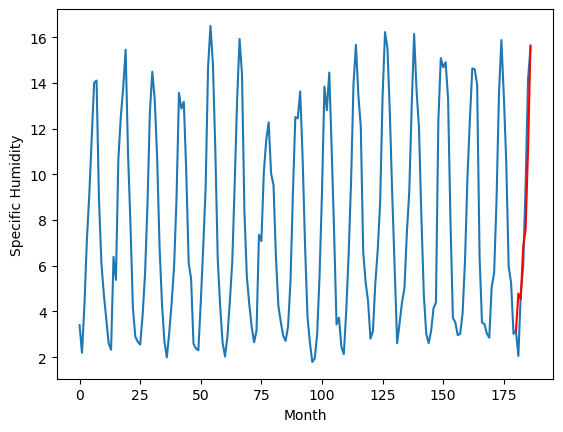

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.65		-0.62
6.26		3.98		-2.28
6.23		5.36		-0.87
6.98		6.00		-0.98
8.31		8.70		0.39
12.60		12.82		0.22
[180, 181, 182, 183, 184, 185, 186]
[7.79, 3.6478439700603484, 3.976795686483383, 5.362677944898605, 6.003100467920303, 8.699511362314224, 12.822690798044205]


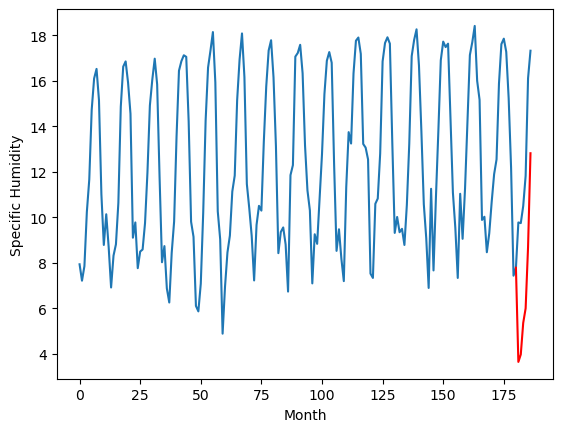

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.64		-0.23
3.75		3.74		-0.01
6.81		6.01		-0.80
7.06		6.64		-0.42
10.50		10.26		-0.24
14.74		14.72		-0.02
[180, 181, 182, 183, 184, 185, 186]
[5.03, 3.6441558706760406, 3.7357525783777237, 6.008252378106118, 6.641522641777993, 10.263469215035439, 14.724701400399208]


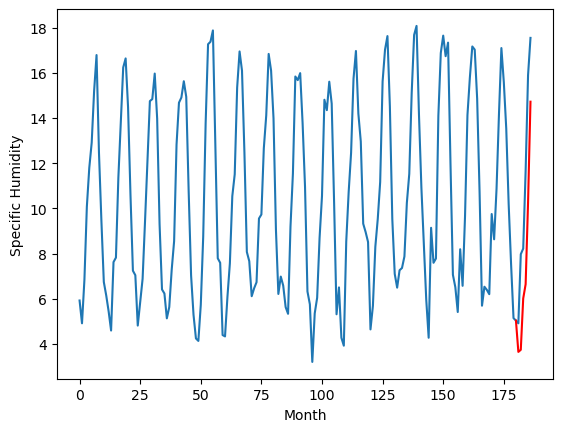

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.53		-0.20
3.41		3.46		0.05
6.07		5.91		-0.16
7.36		6.50		-0.86
11.36		10.34		-1.02
15.05		14.62		-0.43
[180, 181, 182, 183, 184, 185, 186]
[4.41, 3.532174345254898, 3.4558019080758093, 5.910636846125126, 6.501715544760227, 10.33652723222971, 14.618351344168186]


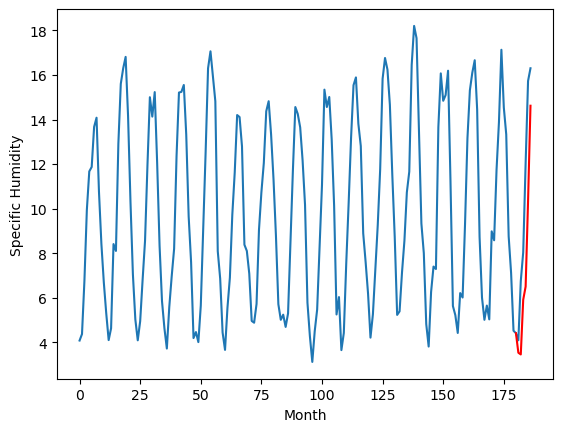

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.12		-0.24
2.91		3.05		0.14
5.49		5.45		-0.04
6.85		6.02		-0.83
11.14		9.82		-1.32
15.02		14.01		-1.01
[180, 181, 182, 183, 184, 185, 186]
[4.29, 3.1156783938407897, 3.049339273571968, 5.454164245724678, 6.021247246861458, 9.822314360737801, 14.011224368214608]


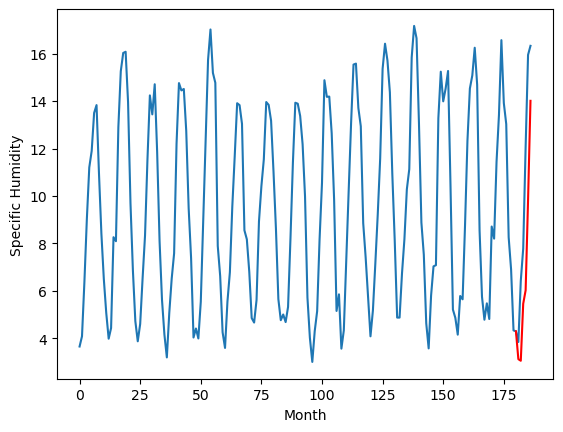

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		7.84		-0.80
8.00		7.97		-0.03
9.49		9.66		0.17
10.45		10.10		-0.35
15.00		13.27		-1.73
17.30		16.79		-0.51
[180, 181, 182, 183, 184, 185, 186]
[3.47, 7.840773189961911, 7.973939816057682, 9.663031736910344, 10.10358069330454, 13.268435935080053, 16.789617995321752]


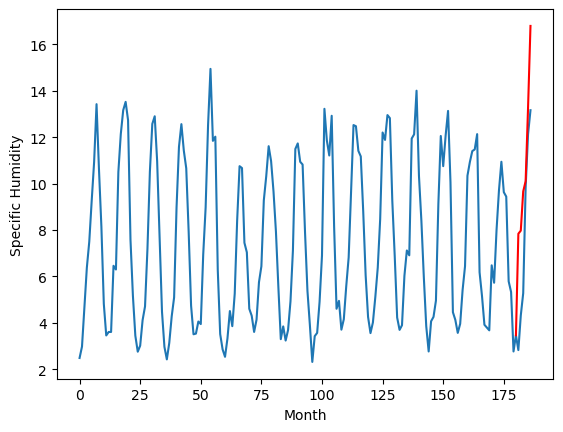

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.51		-0.29
6.05		5.67		-0.38
7.76		7.55		-0.21
8.17		8.29		0.12
11.15		11.42		0.27
15.84		16.02		0.18
[180, 181, 182, 183, 184, 185, 186]
[4.52, 5.511196298599243, 5.6711700093746185, 7.548564089536667, 8.286578966379166, 11.424680305719376, 16.01981980919838]


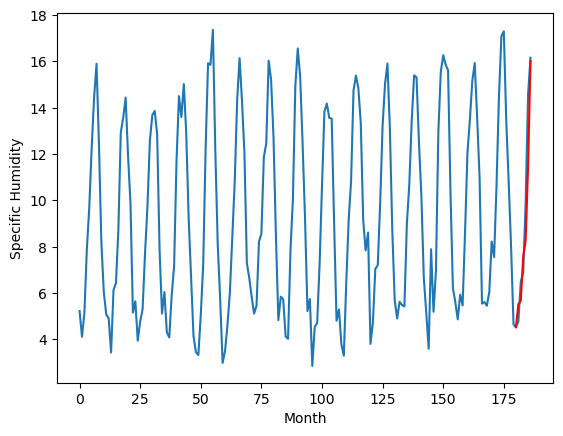

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		3.66		-0.27
3.30		3.55		0.25
5.67		5.90		0.23
6.59		6.63		0.04
9.75		10.25		0.50
14.35		14.85		0.50
[180, 181, 182, 183, 184, 185, 186]
[3.4, 3.6596470642089844, 3.5516572985053063, 5.9040301832556725, 6.632145145833492, 10.2523717674613, 14.847405889928341]


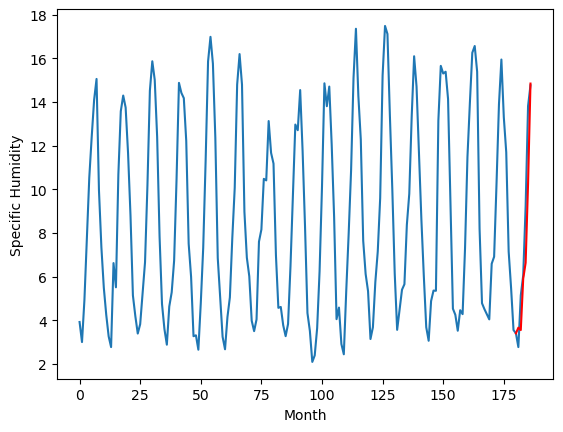

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.07		-0.23
2.73		2.90		0.17
4.67		4.76		0.09
6.00		5.74		-0.26
8.29		8.63		0.34
13.35		13.53		0.18
[180, 181, 182, 183, 184, 185, 186]
[2.82, 3.0669116020202636, 2.904980906844139, 4.757648357748986, 5.737664589285851, 8.62783325612545, 13.530502209067345]


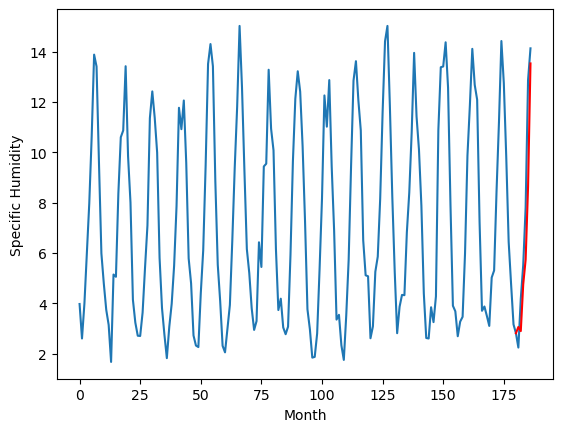

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		1.94		-0.23
1.53		1.71		0.18
3.90		3.80		-0.10
5.21		4.72		-0.49
7.83		7.89		0.06
12.58		12.72		0.14
[180, 181, 182, 183, 184, 185, 186]
[2.86, 1.9435233378410341, 1.705864181518555, 3.7971503639221194, 4.717682113647461, 7.894982805252075, 12.715102663040161]


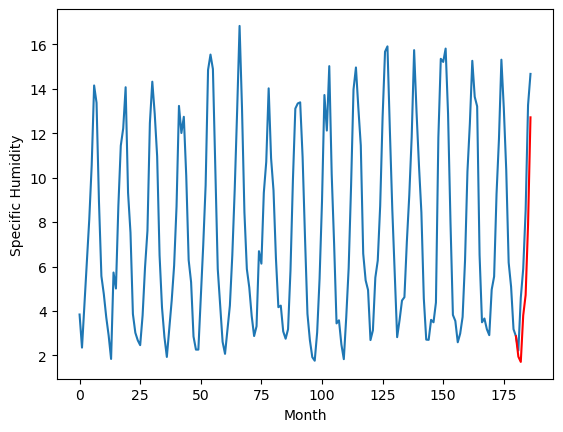

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		4.58		-0.26
4.27		4.46		0.19
5.56		5.93		0.37
7.23		7.01		-0.22
8.83		9.43		0.60
13.84		14.38		0.54
[180, 181, 182, 183, 184, 185, 186]
[2.61, 4.576410980224609, 4.459341147243976, 5.930439927875995, 7.006630280315876, 9.433246710598468, 14.3774362590909]


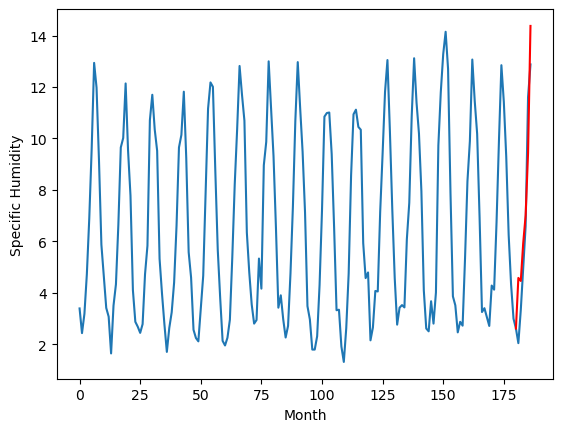

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[4.7815033507347104, 3.6478439700603484, 3.6441558706760406, 3.532174345254898, 3.1156783938407897, 7.840773189961911, 5.511196298599243, 3.6596470642089844, 3.0669116020202636, 1.9435233378410341, 4.576410980224609]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   4.781503
1                 1    4.27   3.647844
2                 2    3.87   3.644156
3                 3    3.73   3.532174
4                 4    3.36   3.115678
5                 5    8.64   7.840773
6                 6    5.80   5.511196
7                 7    3.93   3.659647
8                 8    3.30   3.066912
9                 9    2.17   1.943523
10               10    4.84   4.576411


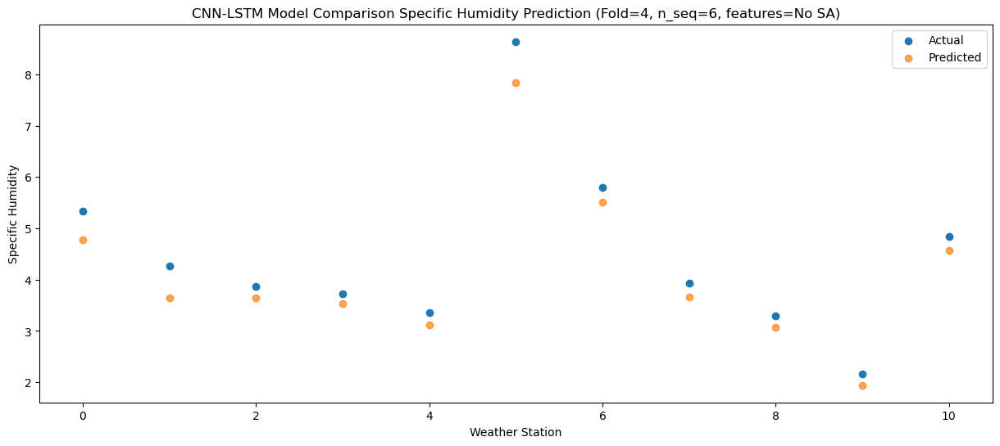

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.544421
1                 1    6.26   3.976796
2                 2    3.75   3.735753
3                 3    3.41   3.455802
4                 4    2.91   3.049339
5                 5    8.00   7.973940
6                 6    6.05   5.671170
7                 7    3.30   3.551657
8                 8    2.73   2.904981
9                 9    1.53   1.705864
10               10    4.27   4.459341


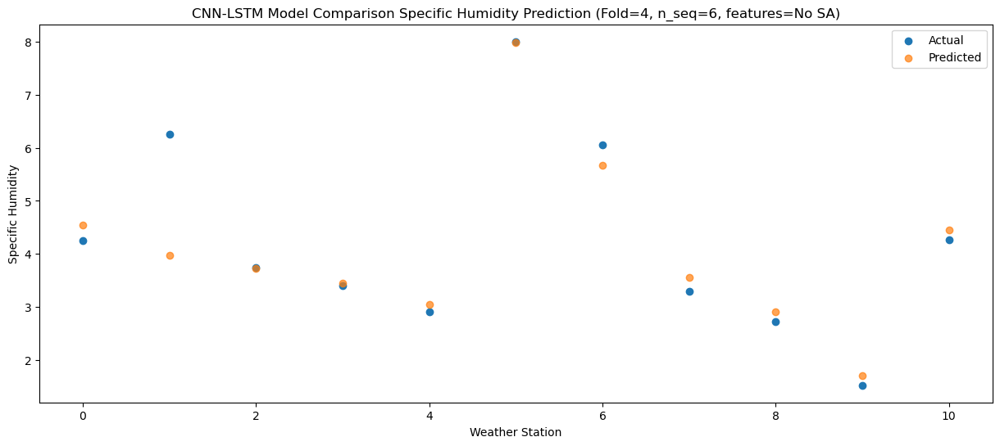

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   6.838253
1                 1    6.23   5.362678
2                 2    6.81   6.008252
3                 3    6.07   5.910637
4                 4    5.49   5.454164
5                 5    9.49   9.663032
6                 6    7.76   7.548564
7                 7    5.67   5.904030
8                 8    4.67   4.757648
9                 9    3.90   3.797150
10               10    5.56   5.930440


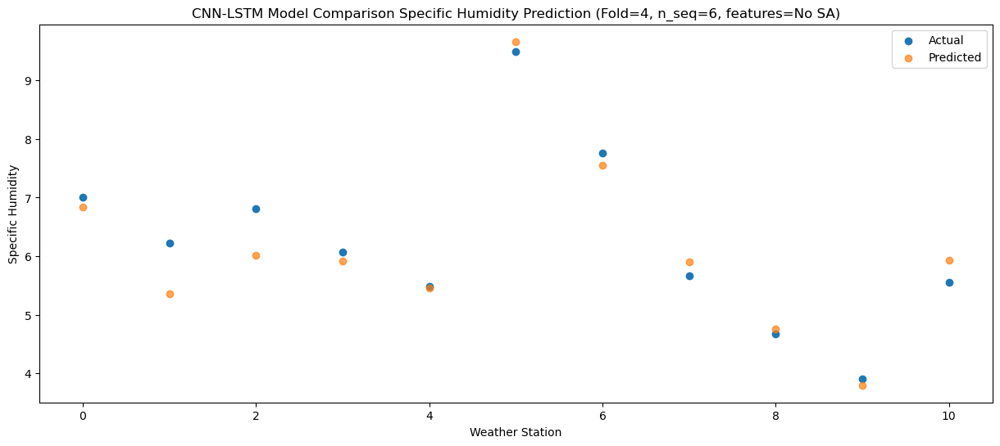

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    8.22   7.603788
1                 1    6.98   6.003100
2                 2    7.06   6.641523
3                 3    7.36   6.501716
4                 4    6.85   6.021247
5                 5   10.45  10.103581
6                 6    8.17   8.286579
7                 7    6.59   6.632145
8                 8    6.00   5.737665
9                 9    5.21   4.717682
10               10    7.23   7.006630


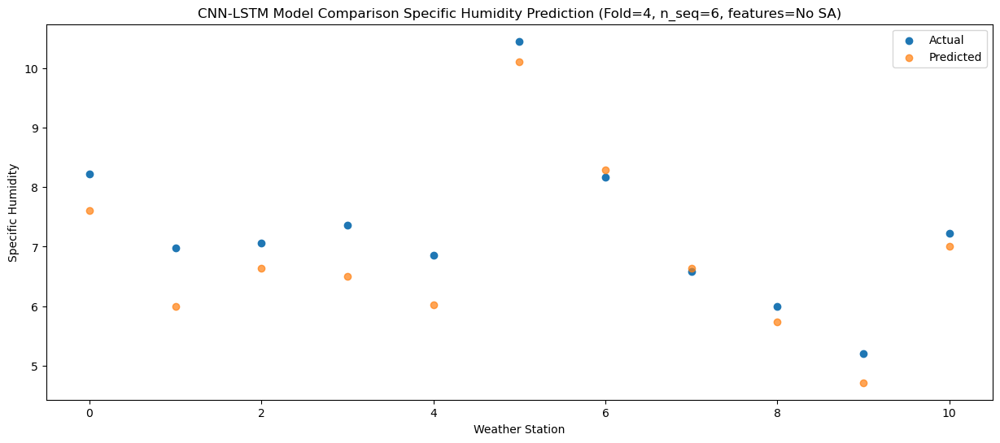

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   11.78  11.122575
1                 1    8.31   8.699511
2                 2   10.50  10.263469
3                 3   11.36  10.336527
4                 4   11.14   9.822314
5                 5   15.00  13.268436
6                 6   11.15  11.424680
7                 7    9.75  10.252372
8                 8    8.29   8.627833
9                 9    7.83   7.894983
10               10    8.83   9.433247


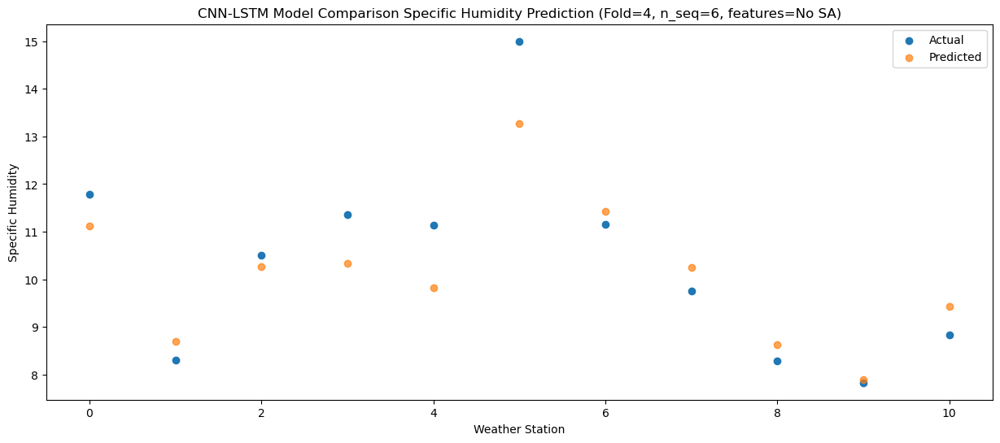

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   16.37  15.639717
1                 1   12.60  12.822691
2                 2   14.74  14.724701
3                 3   15.05  14.618351
4                 4   15.02  14.011224
5                 5   17.30  16.789618
6                 6   15.84  16.019820
7                 7   14.35  14.847406
8                 8   13.35  13.530502
9                 9   12.58  12.715103
10               10   13.84  14.377436


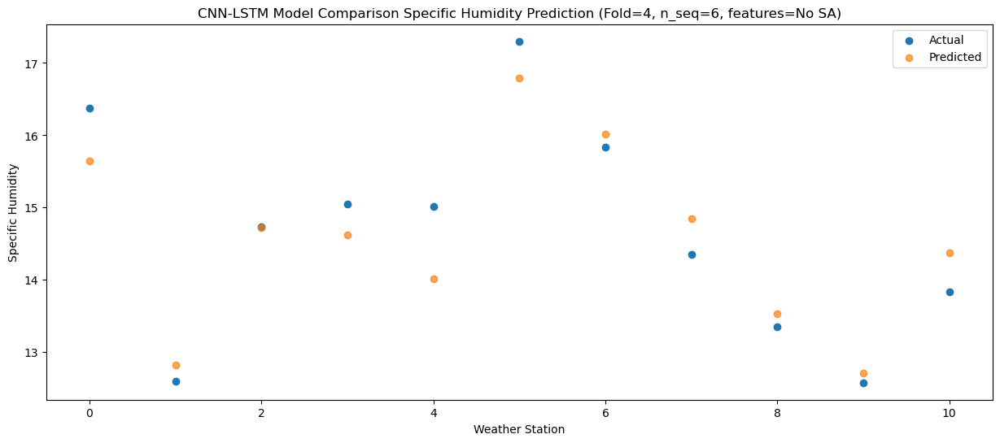

Model: "sequential_1010"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1010 (Conv1D)        (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_1010 (MaxPool  (None, 1, 512)           0         
 ing1D)                                                          
                                                                 
 dropout_3030 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_2020 (LSTM)            (None, 1, 512)            2099200   
                                                                 
 dropout_3031 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_2021 (LSTM)            (None, 512)               2099200   
                                                   

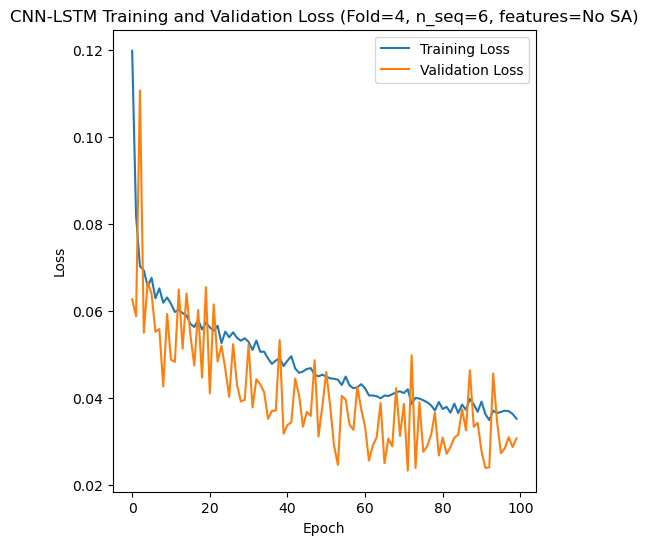

[[0.5415621079032298, 0.5817634534396027, 0.8323520736337442, 0.8968592043818332, 0.9333516371389275, 1.1146032344208874], [0.37010288316656104, 0.30796351584200143, 0.4832813327623861, 1.0188959886327094, 0.804926126670785, 1.3655725154007097], [0.7101324873195307, 1.105708629071698, 1.3977683458104622, 1.385261341698472, 2.284165037221946, 1.517861767294507], [0.30421546789316095, 0.17369034635380196, 0.5608913169596466, 0.4400079645223736, 1.242902695716991, 1.7723063612088983], [0.4066708601371185, 0.7151821840575356, 0.3972777752495707, 0.5583351910824552, 0.81083947132012, 0.492396385361856]]
[[0.48079549551010126, 0.42232314195145226, 0.6293139321018347, 0.7739433996108441, 0.7780599267780777, 0.9664773278751145], [0.3028926425494931, 0.27920891218564736, 0.40932837731458865, 0.8824715693565924, 0.7271731217476453, 1.2550652583214357], [0.6452739664641293, 0.7480245469239624, 1.1819075704840092, 1.0965588371455661, 1.9205241633816192, 1.2070389978723084], [0.19604926037517448, 0

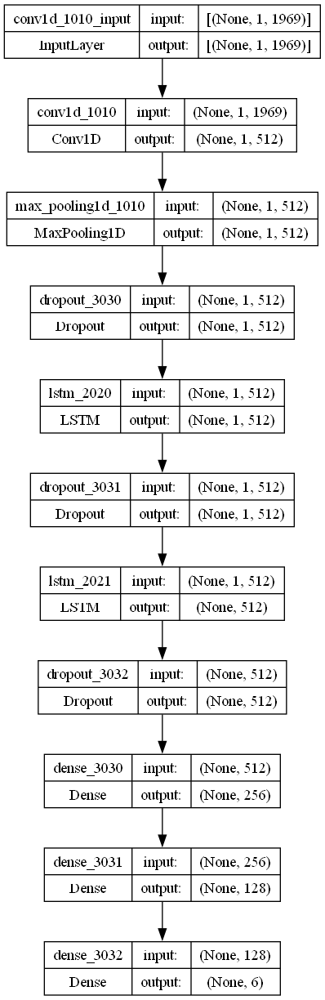

In [11]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best CNN-LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 512
    lr = 0.05954614185913348
    optimizer = SGD(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 512
    dropout_rate = 0.42983708497932444

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S6_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)